# Predicting and Visualizing Urban Climate Futures

Author: Shuang Gao  


## Objective: 
To analyze geospatial and climate data, predict urban heat dynamics, and create insightful visualizations using advanced Python libraries.


## Import Libraries

In [35]:
# Standard libraries
import numpy as np
import pandas as pd
import datetime as dt
from datetime import datetime, timedelta
from collections import Counter, defaultdict
from itertools import cycle
import os
import subprocess
import re
import glob

from meteostat import Point, Daily
from datetime import datetime,timedelta
from scipy.ndimage import gaussian_filter

import shutil
# Visualization
from PIL import Image
import imageio  # For GIF creation
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib import cm
import seaborn as sns
import cartopy.crs as ccrs

import cartopy.feature as cfeature
import plotly.express as px
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d

from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.colors import ListedColormap, BoundaryNorm
import plotly.figure_factory as ff
# Geospatial processing
import geopandas as gpd
import rasterio
from rasterio.merge import merge
from rasterio.plot import show
from rasterio.plot import plotting_extent
from rasterio.transform import from_bounds
from rasterio.warp import transform_bounds
from rasterio.enums import Resampling

import folium
from folium.plugins import MarkerCluster, HeatMap

# Data handling
import xarray as xr
from scipy import stats, sparse, ndimage
from scipy.sparse.linalg import lgmres
from scipy.interpolate import griddata


In [2]:
# Define the base data directory and extraction directories
base_dir = "./Data"  # Base directory for all data
surfRefFolder = "surface_reflectance"
surfTempFolder = "surface_temperature"
surface_reflectance_dir = os.path.join(base_dir, surfRefFolder)   # raw tar files will be extracted into subfolders to this folder
surface_temperature_dir = os.path.join(base_dir, surfTempFolder) # raw tar files will be extracted into subfolders to this folder
LandCoverFolder= "Land_Cover"
LandCover_dir = os.path.join(base_dir, LandCoverFolder)  # GeoTiff will be extracted to this folder

# Ensure the extraction directories exist under "Data"
os.makedirs(surface_reflectance_dir, exist_ok=True)
os.makedirs(surface_temperature_dir, exist_ok=True)

# Workflow


Download from https://earthexplorer.usgs.gov/  
AOI: Centred at Austin (30.25921547660607, -97.74810791015625), radius = 70km  
Date: 05/01/2023 to 05/01/2024  
Cloud Cover Range: <=10%  
Dataset: Landsat C2 U.S. Analysis Ready Data (ARD): Landsat 4-9 C2 U.S. ARD  


In [2]:
# Define the base data directory and extraction directories
base_dir = "./Data"  # Base directory for all data
surfRefFolder = "surface_reflectance"
surfTempFolder = "surface_temperature"
surface_reflectance_dir = os.path.join(base_dir, surfRefFolder)   # raw tar files will be extracted into subfolders to this folder
surface_temperature_dir = os.path.join(base_dir, surfTempFolder) # raw tar files will be extracted into subfolders to this folder
LandCoverFolder= "Land_Cover"
LandCover_dir = os.path.join(base_dir, LandCoverFolder)  # GeoTiff will be extracted to this folder

# Ensure the extraction directories exist under "Data"
os.makedirs(surface_reflectance_dir, exist_ok=True)
os.makedirs(surface_temperature_dir, exist_ok=True)

In [24]:
uhi_dir =  os.path.join(base_dir, "UHI_analysis")   # Band 10 temp, Urban heat island analysis
ndvi_dir = os.path.join(base_dir, "NDVI_analysis")  # Band 4,5 ref, Normalized Difference Vegetation Index analysis
lcc_dir =  os.path.join(base_dir, "LCC_analysis")  # Band 1-7 ref, land_cover_classification analysis

output_dirs = {
    "UHI": uhi_dir,  # 
    "NDVI": ndvi_dir,
    "LCC": lcc_dir,   # 
}
# Ensure output directories exist
inputfolder = "input"
outputfolder = "output"
for dir_name, output_dir in output_dirs.items():
    os.makedirs(output_dir, exist_ok=True)
    os.makedirs(os.path.join(output_dir, inputfolder), exist_ok=True)
    os.makedirs(os.path.join(output_dir, outputfolder), exist_ok=True)






 Thermal Radiance
- **Unit**: W/m²·sr·μm
- **Scaling**:
  - **Multiplicative Factor**: `MULT_THERMAL_RADIANCE` = 0.001
  - **Additive Factor**: 0



---



**Land Surface Temperature (LST) should be corrected for emissivity and atomosphere**

$$
LST = \frac{T(K)}{1 + (\lambda \cdot \frac{T(K)}{h}) \cdot \ln(\varepsilon)}
$$
Where:
- $ T(K) $: Surface temperature from Band 10
- $\varepsilon$ : Emissivity
- $ \lambda, h $: Constants related to wavelength and Planck’s law

 Atmospheric Corrections parameters are all found from the corresponding .json file
- **Upwelling Radiance**:
  - Unit: W/m²·sr·μm
  - Scaling Factor: `MULT_UPWELLING_RADIANCE` = 0.001
- **Downwelling Radiance**:
  - Unit: W/m²·sr·μm
  - Scaling Factor: `MULT_DOWNWELLING_RADIANCE` = 0.001
- **Atmospheric Transmittance**:
  - Unit: Unitless
  - Scaling Factor: `MULT_ATMOSPHERIC_TRANSMITTANCE` = 0.0001

 Emissivity
- **Unit**: Emissivity Coefficient
- **Scaling Factor**: `MULT_EMISSIVITY` = 0.0001
   
Luckily the data I have is ARD data (already corrected).

. Generate UHI Metrics
- Define **urban and rural areas** using masks (e.g., from shapefiles or approximate coordinates).
- Calculate the **Urban Heat Island (UHI) intensity**:
$$
\text{UHI} = T_{\text{urban}} - T_{\text{rural}}
$$


---
Deliverables
1. **UHI Maps**: Spatial heatmaps showing urban heat intensities for each date.
2. **UHI Time Series**: A plot of UHI intensity over time, capturing temporal variations.
3. **NDVI and Land Cover Maps**: Intermediate layers used for emissivity estimation and further classification.

---

By following these steps, I will generate an insightful analysis of urban heat islands, track their progression over time, and provide visual and quantitative outputs for interpretation.


### 1. UHI Analysis
The parameters are read from LC08_CU_015016_20230530_20230610_02_ST/LC08_CU_015016_20230530_20230610_02.json
- **Data Unit**: The unit of Band 10 (B10) surface temperature data is **Kelvin**.
- **Scaling Factors for B10**:
  - **Multiplicative Factor**: `MULT_ST_BAND_10` = 0.00341802
  - **Additive Factor**: `ADD_ST_BAND_10` = 149.0
- **Conversion Formula**:
Convert raw Band 10 (B10) data (DN) into surface temperature (Kelvin):
$$
T(K) = (\text{DN} \times \text{MULT\_ST\_BAND\_10}) + \text{ADD\_ST\_BAND\_10}
$$


#### Generate Urban and Rural mask

In [22]:

def create_urban_rural_masks(nlcd_path, urban_categories,rural_categories, output_dir):
    # Load NLCD mosaic
    with rasterio.open(nlcd_path) as src:
        nlcd_data = src.read(1)  # Read the first band
        nlcd_meta = src.meta

    unique_vals = np.unique(nlcd_data)
    print("Unique values in NLCD data:", unique_vals)

    # Create urban mask
    
    urban_mask = np.isin(nlcd_data, urban_categories)
    
    rural_mask = np.isin(nlcd_data, rural_categories)
    # rural_mask = ~urban_mask
    print("Urban mask True count:", np.sum(urban_mask))
    print("Rural mask True count:", np.sum(rural_mask))
    print("Urban mask unique:", np.unique(urban_mask))

    # Save masks
    os.makedirs(output_dir, exist_ok=True)
    urban_output = os.path.join(output_dir, "Urban_Mask.tif")
    rural_output = os.path.join(output_dir, "Rural_Mask.tif")

    # for mask, output in zip([urban_mask, rural_mask], [urban_output, rural_output]):
    #     with rasterio.open(output, "w", **nlcd_meta) as dst:
    #         # dst.write(mask, 1)
    #         dst.write(mask.astype(np.uint8), 1)
    for mask, output in zip([urban_mask, rural_mask], [urban_output, rural_output]):
    # Remove palette-related keys if any
        nlcd_meta.pop("photometric", None)
        nlcd_meta["dtype"] = "uint8"
        with rasterio.open(output, "w", **nlcd_meta) as dst:
            dst.write(mask.astype(np.uint8)*255, 1)

    return urban_mask, rural_mask
    print(f"Urban mask saved to {urban_output}")
    print(f"Rural mask saved to {rural_output}")

# Urban categories based on NLCD metadata
# 21: Developed, Open Space
# 22: Developed, Low Intensity
# 23: Developed, Medium Intensity
# 24: Developed, High Intensity
urban_categories = [21, 22, 23, 24]

rural_categories = [11, 31, 41, 42, 43, 52, 71, 81, 82, 90, 95]
# Output directory for masks
output_mask_dir = "Data/Land_Cover/output/Masks"

# Create masks
urban_mask, rural_mask = create_urban_rural_masks(output_mosaic_file, urban_categories,rural_categories, output_mask_dir)


Unique values in NLCD data: [11 21 22 23 24 31 41 42 43 52 71 81 82 90 95]
Urban mask True count: 10376522
Rural mask True count: 89623478
Urban mask unique: [False  True]


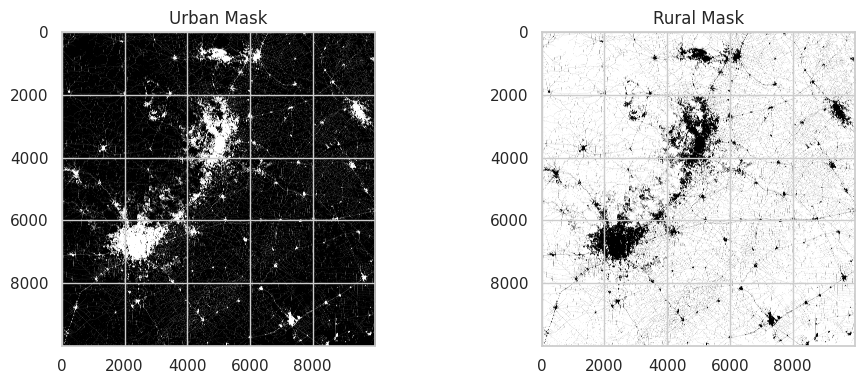

In [175]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Urban mask histogram
axes[0].imshow(urban_mask, cmap='gray', vmin=0, vmax=1)
axes[0].set_title("Urban Mask")

# Rural mask histogram
axes[1].imshow(rural_mask, cmap='gray', vmin=0, vmax=1)
axes[1].set_title("Rural Mask")

plt.tight_layout()
plt.show()

#### Calculation

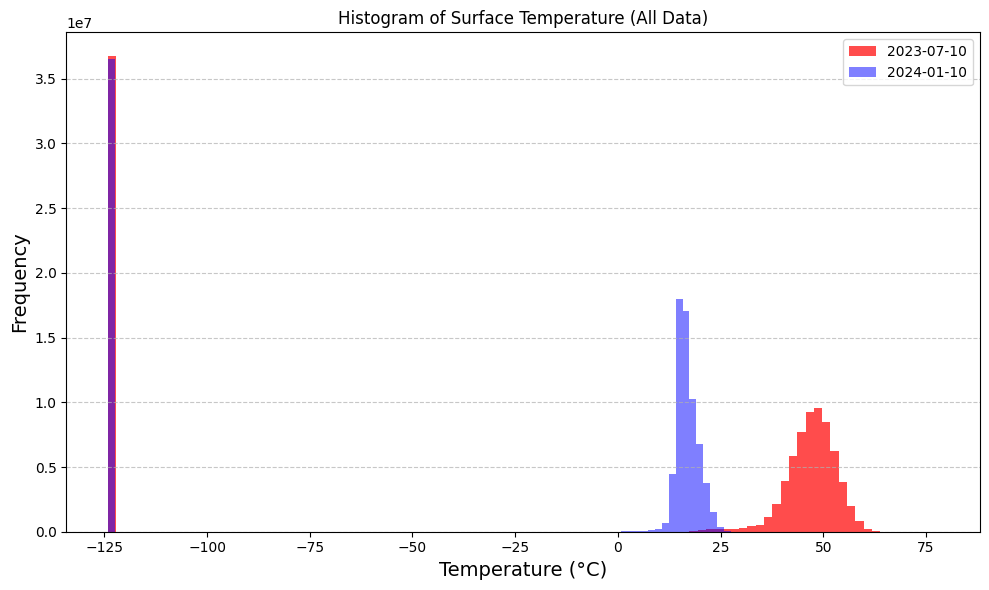

In [25]:
date1 = "2023-07-10"
date2 = "2024-01-10"

file1=os.path.join(uhi_dir, "input",f"LC08_CU_{date1} 00:00:00_ST_B10.tif")
file2=os.path.join(uhi_dir, "input",f"LC09_CU_{date2} 00:00:00_ST_B10.tif")
with rasterio.open(file1) as src:
    data = src.read(1)
    bounds = src.bounds
    width, height = src.width, src.height
    # transform = from_bounds(bounds.left, bounds.bottom, bounds.right, bounds.top, width, height)
    transform = src.transform
    src_crs = src.crs
with rasterio.open(file2) as src:
    data2 = src.read(1)
def kelvin_to_celsius(data):
    return data - 273.15
    
MULT_ST_BAND_10 = 0.00341802
ADD_ST_BAND_10 = 149.0

data = data * float(MULT_ST_BAND_10) + float(ADD_ST_BAND_10)
data2 = data2 * float(MULT_ST_BAND_10) + float(ADD_ST_BAND_10)

flattened_data = kelvin_to_celsius( data.flatten())  
flattened_data2 = kelvin_to_celsius(data2.flatten())

fig, axes = plt.subplots(1, 1, figsize=(10, 6), sharey=True)
axes.hist(flattened_data, bins=100, color='red', alpha=0.7, label=date1)
axes.hist(flattened_data2, bins=100, color='blue', alpha=0.5, label=date2)
axes.set_xlabel("Temperature (°C)", fontsize=14)
axes.set_ylabel("Frequency", fontsize=14)
axes.set_title('Histogram of Surface Temperature (All Data)')
axes.legend()
axes.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

**The above shows there are empty values set at 149 K (-125C) that need be removed.**

In [26]:

Uhi_input_dir = os.path.join(uhi_dir, inputfolder)

Uhi_output_dir = os.path.join(uhi_dir, outputfolder)
os.makedirs(Uhi_output_dir, exist_ok=True)

# Constants for conversion
MULT_ST_BAND_10 = 0.00341802
ADD_ST_BAND_10 = 149.0

def convert_to_temperature(file_path):
    """Convert B10 raw DN values to Kelvin."""
    with rasterio.open(file_path) as src:
        dn = src.read(1)
        # temperature = (dn * MULT_ST_BAND_10) + ADD_ST_BAND_10
        temperature = dn* float(MULT_ST_BAND_10) + float(ADD_ST_BAND_10)
        # analyzed from histogram, many temperature=ADD_ST_BAND_10 that are no valid points, so remove these points
        temperature = np.where(temperature == ADD_ST_BAND_10, np.nan, temperature)  
        meta = src.meta
    return temperature, meta   

def calculate_uhi(temperature_array, urban_mask, rural_mask):
    """Calculate UHI based on urban and rural masks."""
    # Compute a single rural baseline temperature
    rural_temp_mean = np.nanmean(temperature_array[rural_mask])    
    urban_temp_mean = np.nanmean(temperature_array[urban_mask])   
    # Create a new array for UHI map
    uhi_map = temperature_array - rural_temp_mean
    # uhi_map = np.full_like(temperature_array, np.nan, dtype=float)    
    # For urban pixels, difference from rural baseline
    # uhi_map[urban_mask] = temperature_array[urban_mask] - rural_temp_mean    
    return uhi_map, urban_temp_mean, rural_temp_mean

def generate_uhi(input_dir, Uhi_output_dir, urban_mask, rural_mask):
    """Generate UHI maps and time-series."""     

    uhi_intensities = []
    dates = []
    for file in sorted(os.listdir(input_dir)):
        if file.endswith(".tif"):
            file_path = os.path.join(input_dir, file)
            datestr = file.split("_")[2].split()[0]   # "2023-07-10"
            dates.append(datestr)  
            
            # Convert DN to temperature
            temperature, meta = convert_to_temperature(file_path)     
            
            # Calculate UHI
            uhi_map, urban_mean, rural_baseline = calculate_uhi(temperature, urban_mask, rural_mask)
            uhi_intensities.append(urban_mean-rural_baseline)           
            
            # Save UHI map
            output_file = os.path.join(Uhi_output_dir, f"UHI_{datestr}.tif")
            meta.update(dtype="float32", nodata=-9999, compress='lzw')
            with rasterio.open(output_file, "w", **meta) as dst:
                dst.write(uhi_map.astype("float32"), 1)
            
            print(f"Processed: {file} -> UHI map saved to {output_file}")

    sorted_indices = sorted(range(len(dates)), key=lambda i: datetime.strptime(dates[i], "%Y-%m-%d"))
    dates = [dates[i] for i in sorted_indices]
    uhi_intensities = [uhi_intensities[i] for i in sorted_indices]
    return dates, uhi_intensities

dates, uhi_intensities = generate_uhi(Uhi_input_dir, Uhi_output_dir, urban_mask, rural_mask)    

Processed: LC08_CU_2023-07-10 00:00:00_ST_B10.tif -> UHI map saved to ./Data/UHI_analysis/output/UHI_2023-07-10.tif
Processed: LC08_CU_2023-08-11 00:00:00_ST_B10.tif -> UHI map saved to ./Data/UHI_analysis/output/UHI_2023-08-11.tif
Processed: LC08_CU_2023-08-27 00:00:00_ST_B10.tif -> UHI map saved to ./Data/UHI_analysis/output/UHI_2023-08-27.tif
Processed: LC08_CU_2023-11-15 00:00:00_ST_B10.tif -> UHI map saved to ./Data/UHI_analysis/output/UHI_2023-11-15.tif
Processed: LC08_CU_2024-02-19 00:00:00_ST_B10.tif -> UHI map saved to ./Data/UHI_analysis/output/UHI_2024-02-19.tif
Processed: LC09_CU_2023-06-16 00:00:00_ST_B10.tif -> UHI map saved to ./Data/UHI_analysis/output/UHI_2023-06-16.tif
Processed: LC09_CU_2023-07-18 00:00:00_ST_B10.tif -> UHI map saved to ./Data/UHI_analysis/output/UHI_2023-07-18.tif
Processed: LC09_CU_2023-08-19 00:00:00_ST_B10.tif -> UHI map saved to ./Data/UHI_analysis/output/UHI_2023-08-19.tif
Processed: LC09_CU_2023-09-20 00:00:00_ST_B10.tif -> UHI map saved to ./

In [353]:
dates

['2023-06-16',
 '2023-07-10',
 '2023-07-18',
 '2023-08-11',
 '2023-08-19',
 '2023-08-27',
 '2023-09-20',
 '2023-11-15',
 '2024-01-10',
 '2024-02-19']

#### Visualize UHI Maps
- Create heatmaps of temperature differences for each date in the dataset.
- Plot a **time series** of UHI intensity to track its evolution over time.

In [216]:
uhi_output_gif = "./Data/UHI_analysis/UHI_time_series.gif"
uhi_visual_dir = "./Data/UHI_analysis/visuals"
# Function to convert Kelvin to Celsius

# Function to extract date from filename and format it as Month-Year
def extract_date_from_filename(filename):
    """
    Extracts the date (in Month Year format) from a filename.
    Example: UHI_20231115.tif -> November 2023
    """
    try:
        parts = filename.split("_")
        if len(parts) >= 2:  # Expect at least one underscore
            date_part = parts[1].split(".")[0]  # Extract "20231115"
            date_obj = datetime.strptime(date_part, "%Y-%m-%d")
            return date_obj.strftime("%B %Y")  # Format as "Month Year"
        else:
            raise ValueError(f"Filename does not contain a valid date: {filename}")
    except Exception as e:
        print(f"Error extracting date from filename {filename}: {e}")
        return "Unknown Date"


# Function to visualize a single UHI map
def visualize_uhi_map(file_path, save_path=None):
    """Visualize a UHI map in Celsius with a color bar and an updated title."""
    with rasterio.open(file_path) as src:
        uhi_data = src.read(1)
        uhi_data = np.where(uhi_data == src.nodata, np.nan, uhi_data)  # Replace no-data values with NaN
        

    # Extract title from filename
    title = extract_date_from_filename(os.path.basename(file_path))

    # Plot the UHI map
    plt.figure(figsize=(8, 6))
    cmap = plt.get_cmap("coolwarm")
    plt.imshow(uhi_data, cmap=cmap, vmin=np.nanmin(uhi_data), vmax=np.nanmax(uhi_data))
    plt.colorbar(label="Temperature (°C)")
    plt.title(f"UHI Map: {title}", fontsize=14)
    plt.xlabel("Pixel X")
    plt.ylabel("Pixel Y")
    plt.tight_layout()

    # Save or display the plot
    if save_path:
        plt.savefig(save_path, dpi=300)
        plt.close()
    else:
        plt.show()

# Function to visualize all UHI maps and save as PNGs
def generate_visualizations(output_dir, visual_output_dir):
    """Generate individual visualizations and prepare files for GIF creation."""
    os.makedirs(visual_output_dir, exist_ok=True)
    uhi_files = sorted([f for f in os.listdir(output_dir) if f.endswith(".tif")])
    gif_frames = []

    for file in uhi_files:
        file_path = os.path.join(output_dir, file)
        visual_path = os.path.join(visual_output_dir, f"{os.path.splitext(file)[0]}.png")
        print(f"Processing: {file}")
        visualize_uhi_map(file_path, save_path=visual_path)
        gif_frames.append(visual_path)

    return gif_frames
def create_gif_from_visuals(gif_frames, output_file, duration=1000):
    """
    Create a GIF from a list of image frames.

    Parameters:
    - gif_frames: List of file paths to image frames (e.g., .png files).
    - output_file: Path to save the generated GIF (e.g., .gif file).
    - duration: Time (in milliseconds) each frame will stay before transitioning to the next.
    """
    # Open the image frames
    frames = [Image.open(frame) for frame in gif_frames]
    
    # Save as GIF
    frames[0].save(
        output_file,
        save_all=True,
        append_images=frames[1:],
        duration=duration,  # Time each frame stays (in milliseconds)
        loop=0  # Loop forever
    )
    print(f"GIF saved to {output_file}")
    
gif_frames = generate_visualizations(Uhi_output_dir, uhi_visual_dir)
create_gif_from_visuals(gif_frames, uhi_output_gif, duration=1000)  # 1000ms = 1 second   

Processing: UHI_2023-06-16.tif
Processing: UHI_2023-07-10.tif
Processing: UHI_2023-07-18.tif
Processing: UHI_2023-08-11.tif
Processing: UHI_2023-08-19.tif
Processing: UHI_2023-08-27.tif
Processing: UHI_2023-09-20.tif
Processing: UHI_2023-11-15.tif
Processing: UHI_2024-01-10.tif
Processing: UHI_2024-02-19.tif
GIF saved to ./Data/UHI_analysis/UHI_time_series.gif


GIF saved to ./Data/UHI_analysis/UHI_3D_animation.gif


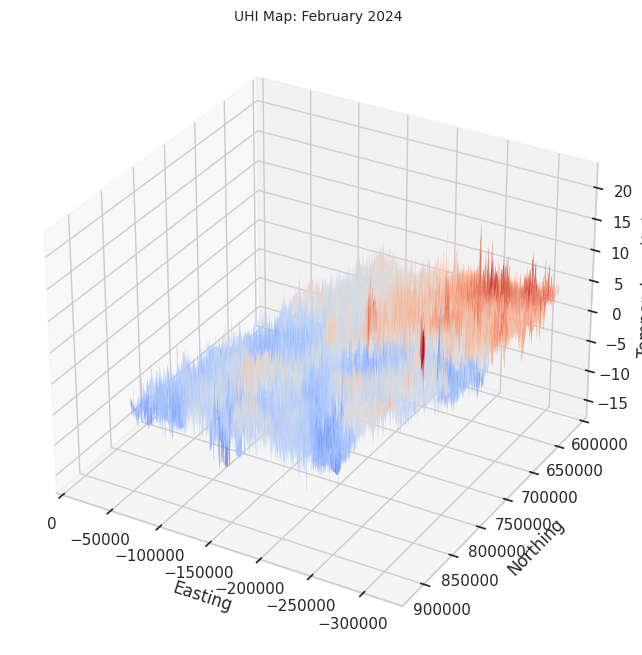

In [223]:

def generate_3d_surface_plot(file_path):
    """
    Generate a 3D surface plot for a single temperature map.

    Parameters:
    - file_path: Path to the temperature map file.

    Returns:
    - X, Y, Z arrays for the surface plot.
    """
    # Load the temperature data from the file
    with rasterio.open(file_path) as src:
        data = src.read(1)  # Read the first band
        transform = src.transform  # Get transform for coordinates
        x = np.arange(data.shape[1]) * transform[0] + transform[2]
        y = np.arange(data.shape[0]) * transform[4] + transform[5]
        X, Y = np.meshgrid(x, y)
        Z = data 

    return X, Y, Z

def plot_3d_surface(X, Y, Z, ax, title):
    """
    Plot a 3D surface.

    Parameters:
    - X, Y, Z: Surface data.
    - ax: 3D axis object.
    - title: Title for the plot.
    """
    ax.plot_surface(X, Y, Z, cmap="coolwarm", edgecolor="none", alpha=0.9)
    ax.set_title(title, fontsize=10)
    ax.set_xlabel("Easting")
    ax.set_ylabel("Northing")
    ax.set_zlabel("Temperature (°C)")
    ax.view_init(elev=30, azim=120)  # Set view angle

def create_3d_animation(map_dir, output_gif, duration=1000):
    """
    Create an animated 3D surface plot showing temperature changes over time.

    Parameters:
    - map_dir: Directory containing temperature maps.
    - output_gif: Path to save the animated GIF.
    - duration: Duration for each frame in milliseconds.
    """
    files = sorted([f for f in os.listdir(map_dir) if f.endswith(".tif")])
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection="3d")

    def update(frame):
        ax.clear()
        file_path = os.path.join(map_dir, files[frame])
        X, Y, Z = generate_3d_surface_plot(file_path)
        titledate= extract_date_from_filename(os.path.basename(file_path))
        plot_3d_surface(X, Y, Z, ax, title=f"UHI Map: {titledate}")

    ani = FuncAnimation(fig, update, frames=len(files), repeat=True)
    writer = PillowWriter(fps=1000 // duration)
    ani.save(output_gif, writer=writer)
    print(f"GIF saved to {output_gif}")

# Example Usage

output_gif = "./Data/UHI_analysis/UHI_3D_animation.gif"
create_3d_animation(Uhi_output_dir, output_gif, duration=1000)


### Visualize Temperature

15.558149479999997 and 78.0087929
-29.033339439999963 and 42.38960648


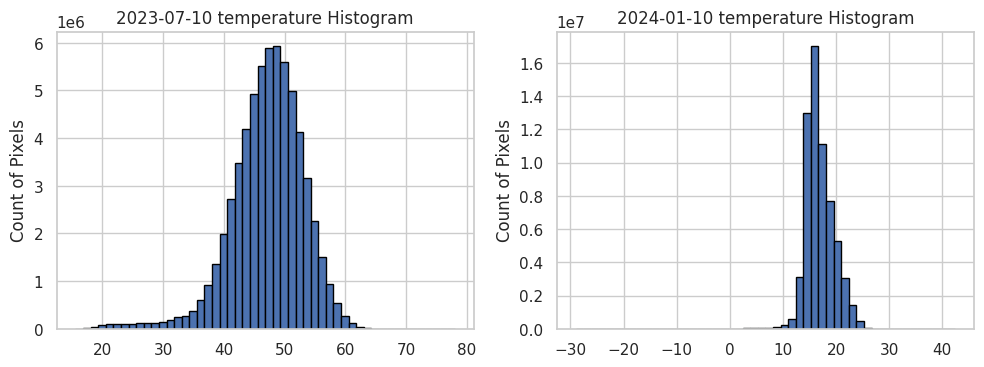

In [166]:
date1 = "2023-07-10"
date2 = "2024-01-10"

with rasterio.open(os.path.join(Uhi_input_dir, f"LC08_CU_{date1} 00:00:00_ST_B10.tif")) as src10:
    uhi10 = src10.read(1)
    transform = src10.transform
    crs = src10.crs
    bounds = src10.bounds
with rasterio.open(os.path.join(Uhi_input_dir, f"LC09_CU_{date2} 00:00:00_ST_B10.tif")) as src20:
    uhi20 = src20.read(1)

aea_proj = ccrs.AlbersEqualArea(central_longitude=-96, central_latitude=23,
                                standard_parallels=(29.5, 45.5))
temperature1, meta = convert_to_temperature(os.path.join(Uhi_input_dir, f"LC08_CU_{date1} 00:00:00_ST_B10.tif"))     
temp_celsius1 = kelvin_to_celsius(temperature1)
vmin, vmax = np.nanmin(temp_celsius1), np.nanmax(temp_celsius1)
print(f'{vmin} and {vmax}')
temperature2, meta = convert_to_temperature(os.path.join(Uhi_input_dir, f"LC09_CU_{date2} 00:00:00_ST_B10.tif"))     
temp_celsius2 = kelvin_to_celsius(temperature2)
vmin, vmax = np.nanmin(temp_celsius2), np.nanmax(temp_celsius2)
print(f'{vmin} and {vmax}')

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Urban mask histogram
axes[0].hist(temp_celsius1.flatten(),  bins=50, edgecolor='black')
axes[0].set_title(f"{date1} temperature Histogram")
# axes[0].set_xticks([0,1])
# axes[0].set_xticklabels(["False","True"])
axes[0].set_ylabel("Count of Pixels")

# Rural mask histogram
axes[1].hist(temp_celsius2.flatten(), bins=50, edgecolor='black')
axes[1].set_title(f"{date2} temperature Histogram")
# axes[1].set_xticks([0,1])
# axes[1].set_xticklabels(["False","True"])
axes[1].set_ylabel("Count of Pixels")

plt.tight_layout()
plt.show()

**From the histgram we see the temperature is mainly btw 0 and 70 C degree**

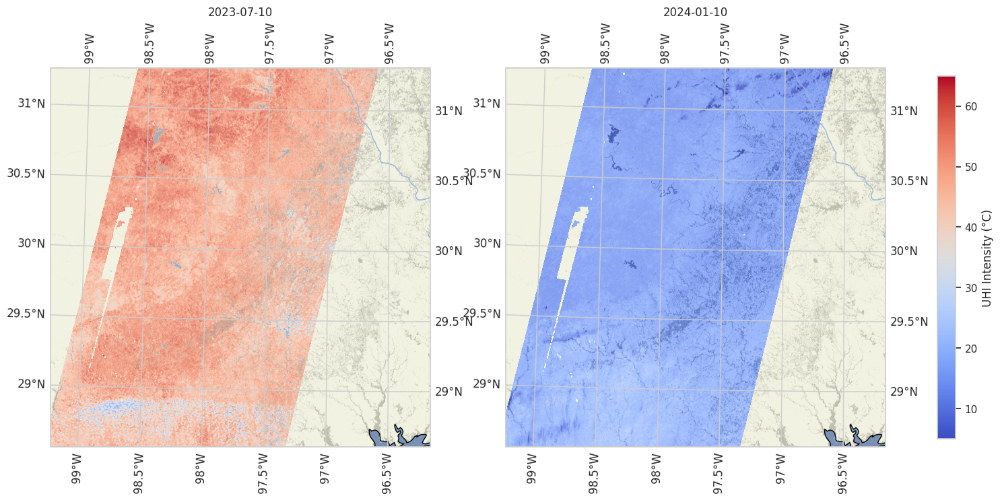

In [171]:


# Apply temperature to the masks
# urban_temperature = np.where(urban_mask, uhi10, np.nan)
# rural_temperature = np.where(rural_mask, uhi10, np.nan)

fig, axes = plt.subplots(1, 2, figsize=(20,10), subplot_kw={'projection': aea_proj})

# Plot the first UHI map
vmin=5
vmax=65
axes[0].set_extent([bounds.left, bounds.right, bounds.bottom, bounds.top], crs=aea_proj)
axes[0].coastlines()
axes[0].add_feature(cfeature.OCEAN)
axes[0].add_feature(cfeature.LAND)
axes[0].add_feature(cfeature.RIVERS)
axes[0].add_feature(cfeature.LAKES)
axes[0].add_feature(cfeature.BORDERS, linestyle='-')
axes[0].gridlines(draw_labels=True)
im1 = axes[0].imshow(temp_celsius1, transform=aea_proj, 
    extent=rasterio.plot.plotting_extent(src10), cmap='coolwarm', vmin=vmin, vmax=vmax)
axes[0].imshow(urban_mask, transform=aea_proj, 
    extent=rasterio.plot.plotting_extent(src10), cmap='gray', alpha=0.2)
axes[0].set_title(date1)

# Plot the second UHI map

axes[1].set_extent([bounds.left, bounds.right, bounds.bottom, bounds.top], crs=aea_proj)

axes[1].gridlines(draw_labels=True)
axes[1].imshow(temp_celsius2, transform=aea_proj, 
    extent=rasterio.plot.plotting_extent(src10), cmap='coolwarm', vmin=vmin, vmax=vmax)
axes[1].imshow(urban_mask, transform=aea_proj, 
    extent=rasterio.plot.plotting_extent(src10), cmap='gray', alpha=0.2)
axes[1].set_title(date2)
axes[1].coastlines()
axes[1].add_feature(cfeature.OCEAN)
axes[1].add_feature(cfeature.LAND)
axes[1].add_feature(cfeature.RIVERS)
axes[1].add_feature(cfeature.LAKES)
axes[1].add_feature(cfeature.BORDERS, linestyle='-')

# Add a single colorbar for both
fig.colorbar(im1, ax=axes, label='UHI Intensity (°C)', shrink=0.7)

plt.show()


In [ ]:
It is interesting to find some "Evergreen Forest" areas near the Open water area is very hot during the summer


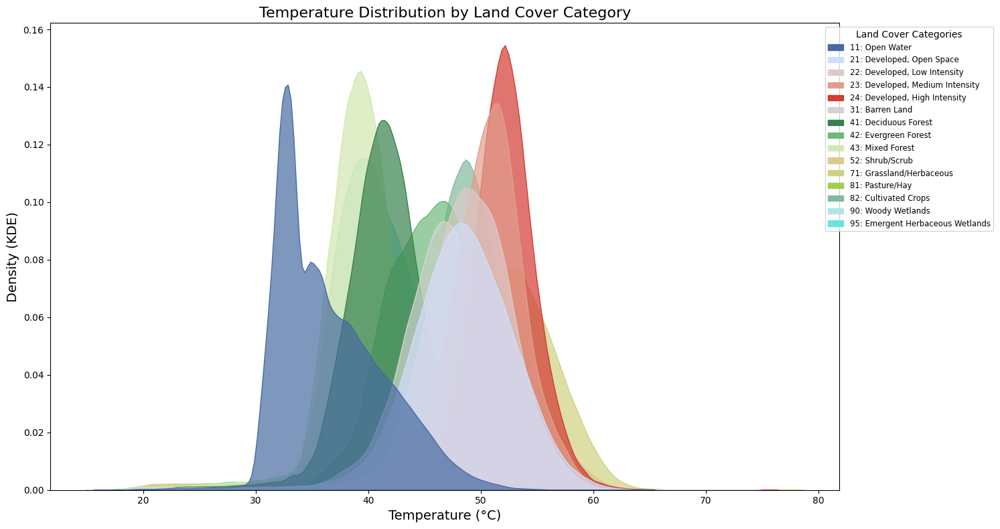

In [160]:

# Unique category codes
category_codes = [11, 21, 22, 23, 24, 31, 41, 42, 43, 52, 71, 81, 82, 90, 95]

# Create a colormap for the categories
# colors = [
#     "#476ba1", "#d1defa", "#decaca", "#e29e8c", "#d33b33",
#     "#d3d3d3", "#38814e", "#6cba7a", "#d4e7b0", "#dcca8f",
#     "#d1d182", "#a3cc51", "#82ba9e", "#b5e4e0", "#6ae5e0"
# ]
color_map = {code: color for code, color in zip(category_codes, colors)}

# category_cmap = ListedColormap(colors)
handles = [
    mpatches.Patch(color=color_map[code], label=f"{code}: {category_labels[code]}")
    for code in category_codes
]

# Load temperature data and category data
with rasterio.open(output_mosaic_file) as src:
    nlcd_data = src.read(1)  # Read category data


temp_flat = temp_celsius1.flatten()
categories_flat = nlcd_data.flatten()

# Mask temperature where category is not valid
temp_celsius1_masked = np.where(np.isin(nlcd_data, category_codes), temp_celsius1, np.nan)

# Prepare data for seaborn
rows = []
for code in category_codes:
    mask = nlcd_data == code
    temps = temp_celsius1_masked[mask]
    rows.extend([(code, temp) for temp in temps if not np.isnan(temp)])

tempCode1 = pd.DataFrame(rows, columns=["Category", "Temperature"])
tempCode1["Category Label"] = tempCode1["Category"].map(category_labels)

# Plotting the data using seaborn
plt.figure(figsize=(15, 8))
palette = {category_labels[code]: color_map[code] for code in category_codes}
ax = sns.kdeplot(
    data=tempCode1, x="Temperature", hue="Category Label", fill=True,
    common_norm=False, palette=palette, alpha=0.7
)


plt.title("Temperature Distribution by Land Cover Category", fontsize=16)
plt.xlabel("Temperature (°C)", fontsize=14)
plt.ylabel("Density (KDE)", fontsize=14)

# plt.legend(title="Land Cover Category", bbox_to_anchor=(1.05, 1), loc="upper left")
ax.legend(
    handles=handles,
    title="Land Cover Categories",
    loc="upper right",
    bbox_to_anchor=(1.2, 1),
    fontsize="small",
    title_fontsize="medium",
)
plt.tight_layout()
plt.show()


In [158]:
tempCode1.head()

,Category,Temperature,Category Label,Class
0,11,41.405217,Open Water,2
1,11,40.742121,Open Water,2
2,11,42.512655,Open Water,2
3,11,42.786097,Open Water,2
4,11,45.219727,Open Water,2


`do the same thing for date2`

In [162]:
temp_celsius2_masked = np.where(np.isin(nlcd_data, category_codes), temp_celsius2, np.nan)
rows = []
for code in category_codes:
    mask = nlcd_data == code
    temps = temp_celsius2_masked[mask]
    rows.extend([(code, temp) for temp in temps if not np.isnan(temp)])
tempCode2 = pd.DataFrame(rows, columns=["Category", "Temperature"])
tempCode2["Category Label"] = tempCode2["Category"].map(category_labels)


In [163]:
tempCode2.head()

,Category,Temperature,Category Label
0,11,12.208490,Open Water
1,11,11.924794,Open Water
2,11,13.869648,Open Water
3,11,14.074729,Open Water
4,11,12.389645,Open Water


**In the plot below, you can move your cursor to any point and see its value and category**


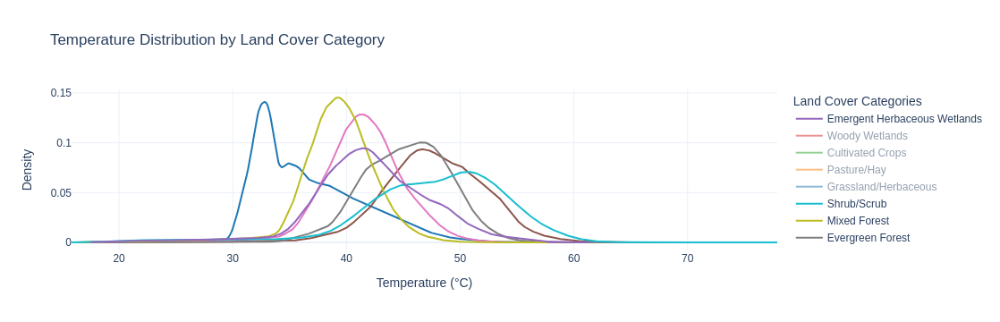

In [527]:


# Group temperature data by category
categories = tempCode1["Category Label"].unique()
temp_data_by_category = [
    tempCode1[tempCode1["Category Label"] == category]["Temperature"].dropna().values
    for category in categories
]

# Create the KDE plot
fig = ff.create_distplot(
    temp_data_by_category,
    group_labels=categories,
    show_hist=False,
    show_rug=False,
)

# Update layout for better display
fig.update_layout(
    title="Temperature Distribution by Land Cover Category",
    xaxis_title="Temperature (°C)",
    yaxis_title="Density",
    legend_title="Land Cover Categories",
    template="plotly_white",
)

# Show the plot
fig.show()


In [74]:
# Compute statistics for each category
description = tempCode1.groupby("Category")["Temperature"].describe()

# Format the statistics and include the category label
formatted_description = description.copy()
formatted_description["Category Label"] = formatted_description.index.map(category_labels)

# Apply .2f formatting to numeric values
formatted_description = formatted_description.round(2)

# Reset index for better display
formatted_description = formatted_description.reset_index()

# Reorder columns for better readability
formatted_description = formatted_description[[
    "Category", "Category Label", "count", "mean", "std", "min", "25%", "50%", "75%", "max"
]]
pd.set_option("display.max_columns",None)
pd.set_option("display.width", 1000)
pd.set_option("display.max_colwidth",100)
# Display the formatted statistics
print(formatted_description)

# Optionally save to CSV
formatted_description.to_csv("temperature_description_formatted.csv", index=False)



    Category                Category Label       count   mean   std    min    25%    50%    75%    max
0         11                    Open Water    477576.0  36.64  4.72  16.60  32.90  35.58  39.69  64.44
1         21         Developed, Open Space   2566043.0  48.21  5.02  15.88  45.50  48.41  51.38  73.71
2         22      Developed, Low Intensity   3241894.0  48.84  4.30  15.67  46.47  49.01  51.54  74.03
3         23   Developed, Medium Intensity   1884931.0  50.53  3.73  15.93  48.61  50.78  52.72  74.27
4         24     Developed, High Intensity    352346.0  51.90  3.29  16.00  50.21  52.01  53.78  75.68
5         31                   Barren Land    258612.0  47.67  4.60  16.81  44.87  47.65  50.75  65.24
6         41              Deciduous Forest   1984720.0  41.42  3.74  16.27  39.40  41.49  43.64  62.49
7         42              Evergreen Forest   6405366.0  45.26  3.86  17.05  42.63  45.43  47.97  72.44
8         43                  Mixed Forest   1106485.0  39.24  3.51  16.2


`The average values and max values of "Shrub", "Grassland", "Pasture", and "Cultivated Crops" have similar or higher values than "Developed" areas (urban area), I think the classes might be misclassified.`



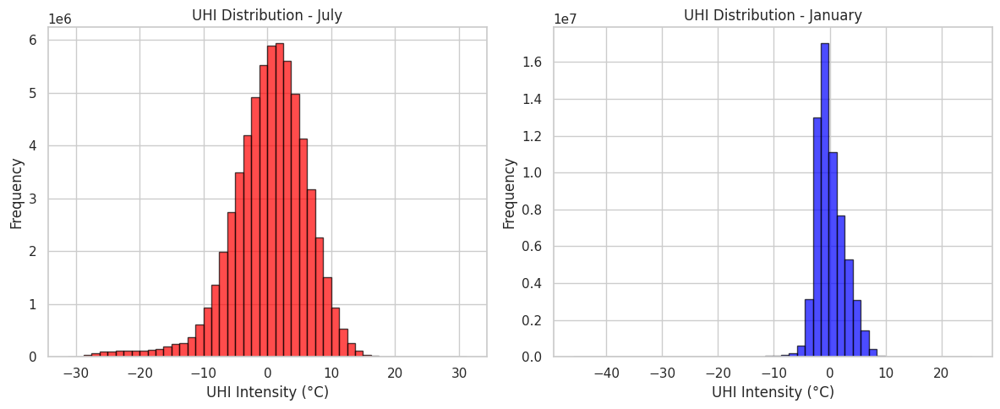

In [195]:
with rasterio.open(os.path.join(Uhi_output_dir, f"UHI_{date1}.tif")) as src1:
    uhi1 = src1.read(1)
    transform = src1.transform
    crs = src1.crs
with rasterio.open(os.path.join(Uhi_output_dir, f"UHI_{date2}.tif")) as src2:
    uhi2 = src2.read(1)
 # Flatten and remove NaNs
uhi1n = uhi1[~np.isnan(uhi1)]
uhi2n = uhi2[~np.isnan(uhi2)]

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# July histogram
axes[0].hist(uhi1n, bins=50, color='red', alpha=0.7, edgecolor='black')
axes[0].set_title("UHI Distribution - July")
axes[0].set_xlabel("UHI Intensity (°C)")
axes[0].set_ylabel("Frequency")

# January histogram
axes[1].hist(uhi2n, bins=50, color='blue', alpha=0.7, edgecolor='black')
axes[1].set_title("UHI Distribution - January")
axes[1].set_xlabel("UHI Intensity (°C)")
axes[1].set_ylabel("Frequency")

plt.tight_layout()
plt.show()   

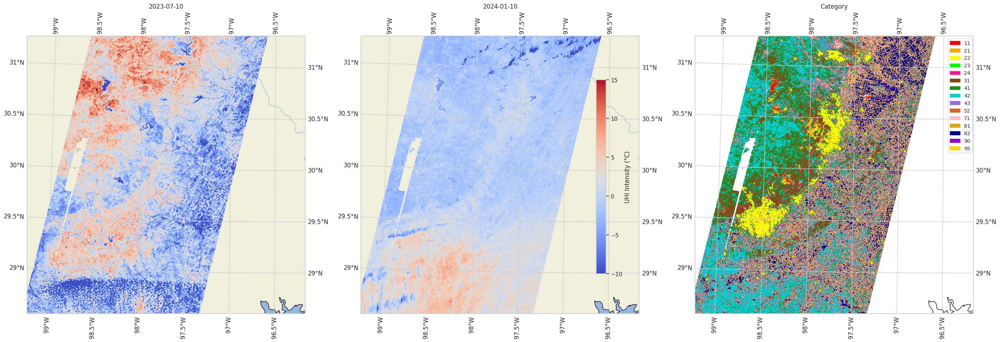

In [386]:
fig, axes = plt.subplots(1, 3, figsize=(35, 10), subplot_kw={'projection': ccrs.AlbersEqualArea(
    central_longitude=-96, central_latitude=23, standard_parallels=(29.5, 45.5))})

# Common settings for the extent
extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]

# Plot the first UHI map
axes[0].set_extent(extent, crs=aea_proj)
axes[0].coastlines()
axes[0].add_feature(cfeature.OCEAN)
axes[0].add_feature(cfeature.LAND)
axes[0].add_feature(cfeature.RIVERS)
axes[0].add_feature(cfeature.LAKES)
axes[0].add_feature(cfeature.BORDERS, linestyle='-')
axes[0].gridlines(draw_labels=True)
im1 = axes[0].imshow(uhi1, transform=aea_proj, extent=rasterio.plot.plotting_extent(src1), 
                     cmap='coolwarm', vmin=vmin, vmax=vmax)
axes[0].set_title(date1)

# Plot the second UHI map
axes[1].set_extent(extent, crs=aea_proj)
axes[1].coastlines()
axes[1].gridlines(draw_labels=True)
im2 = axes[1].imshow(uhi2, transform=aea_proj, extent=rasterio.plot.plotting_extent(src2), 
                     cmap='coolwarm', vmin=vmin, vmax=vmax)
axes[1].set_title(date2)
axes[1].add_feature(cfeature.OCEAN)
axes[1].add_feature(cfeature.LAND)
axes[1].add_feature(cfeature.RIVERS)
axes[1].add_feature(cfeature.LAKES)
axes[1].add_feature(cfeature.BORDERS, linestyle='-')

# Add a single colorbar for both UHI plots
cbar = fig.colorbar(im1, ax=axes[:2], location='right', label='UHI Intensity (°C)', shrink=0.7)

# Plot the category map (ensure NaNs are handled properly)
category_data_nan = category_data.astype(float)
category_data_nan[np.isnan(uhi2)] = np.nan

axes[2].set_extent(extent, crs=aea_proj)
axes[2].coastlines()
axes[2].gridlines(draw_labels=True)
im3 = axes[2].imshow(
    category_data_nan, transform=aea_proj, extent=rasterio.plot.plotting_extent(src2), 
    cmap=color_map
)
axes[2].set_title('Category')

# Add the legend for the third plot
handles1 = [
    mpatches.Patch(color=colors[i], label=f"{code}")
    for i, (code, label) in enumerate(category_labels.items())
]
legend = axes[2].legend(handles=handles1, bbox_to_anchor=(0.9, 1), loc="upper left", fontsize="small")

# Adjust subplot layout to ensure alignment
plt.subplots_adjust(wspace=0.2, top=0.9, bottom=0.1, left=0.1, right=0.85)

# Show the plot
plt.show()


In [200]:
threshold_temp = 70
categories_above_threshold = tempCode1[tempCode1["Temperature"] > threshold_temp]["Category Label"].unique()
print(f"Categories with temperature > {threshold_temp}°C: {categories_above_threshold}")


Categories with temperature > 70°C: ['Developed, Open Space' 'Developed, Low Intensity'
 'Developed, Medium Intensity' 'Developed, High Intensity'
 'Evergreen Forest' 'Shrub/Scrub' 'Grassland/Herbaceous' 'Pasture/Hay'
 'Cultivated Crops']


Observation:
1. The UHI map distribution is quite different in summer and in winter. They don't even overlap.
2. UHI hot spots diminishes in winter.
3. UHI hot spots are in Evergreen Forest in summer but in Grassland
4. Some areas in 'Evergreen Forest' 'Shrub/Scrub' 'Grassland/Herbaceous' 'Pasture/Hay',  'Cultivated Crops' have very high temperature in summer
   

There are several factors—both natural and anthropogenic—that can cause high surface temperatures in these vegetation-dominated land covers during summer:

1. Reduced Soil Moisture and Evapotranspiration:
Vegetation normally cools its surroundings by transpiring water. During hot, dry conditions, soil moisture can become limited, reducing the cooling effect of evapotranspiration. Even "green" areas can heat up significantly if they’re drought-stressed or have shallow root systems.

2. Seasonal Phenology and Crop Types:
Certain crops or grassland species may have stages in their growth cycle when their leaf area is low, or they’ve been recently harvested, leaving more exposed soil. Exposed soil and dry plant residue can absorb and retain more heat, driving up surface temperature. Similarly, hayfields may have been recently cut, reducing the plant canopy’s cooling effect.

3. Vegetation Structure and Density:
Evergreen forests usually maintain foliage year-round, but under extreme heat and drought, they might still have lower transpiration rates. Shrub/scrub areas with low, sparse vegetation can have a lot of exposed ground, leading to higher surface temperatures. Grasslands or pastures with short, sparse vegetation also offer less shade and have more direct soil exposure.

4. Management Practices (Human Activities):
Agricultural lands might be irrigated differently or treated with management practices that alter local microclimates. Some practices (e.g., leaving fields fallow, using certain tillage methods, or planting crops that have high reflectivity but low transpiration) can influence how much the land heats up during the day.

5. Local Climate and Weather Events:
Heat waves, lack of rain, and specific weather patterns can cause vegetation and soils—even in what is generally considered “rural vegetation cover”—to heat up considerably. Prolonged high temperatures combined with low humidity and drying winds can turn even well-vegetated areas into hotspots, temperature-wise.

In Summary:
It’s a combination of natural and human-influenced factors. While human activities (like crop choice, irrigation practices, and land management) can play a role, natural seasonal and weather conditions (drought, reduced soil moisture, vegetation phenology) often have a significant impact on why these areas can become very hot in summer.

### Analysis UHI map

/tmp/ipykernel_1071441/3808424284.py:7: FutureWarning:



The `scale_hue` parameter has been replaced and will be removed in v0.15.0. Pass `common_norm=True` for the same effect.



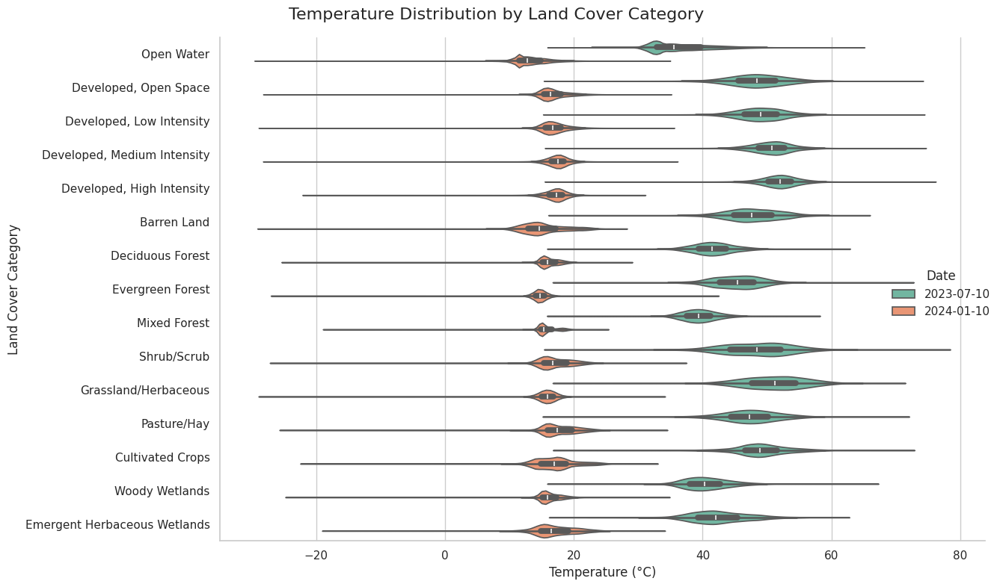

In [164]:

tempCode1["Date"] = date1
tempCode2["Date"] = date2
tempCode12 = pd.concat([tempCode1, tempCode2], ignore_index=True)

# Create the catplot
sns.set(style="whitegrid")
g = sns.catplot(
    data=tempCode12,
    kind="violin",
    y="Category Label",
    x="Temperature",
    hue="Date",
    scale_hue=False,
    density_norm="width",
    inner="box",
    height=8,
    aspect=1.5,
    palette="Set2",  # Used palette="Set2" for distinguishable colors.
)

# Customize the plot
g.set_axis_labels("Temperature (°C)", "Land Cover Category")
g.fig.suptitle("Temperature Distribution by Land Cover Category", fontsize=16)
g.set(ylim=(None, None))
plt.tight_layout()

# Show the plot
plt.show()



Observations:

    - Variation in Temperature Across Categories:
        Some categories, like "Developed, High Intensity," have higher median temperatures and narrower ranges, particularly in summer. This reflects the concentrated heat in densely developed urban areas.
        Forest categories, such as "Deciduous Forest" and "Evergreen Forest," exhibit relatively cooler medians, consistent with vegetation's cooling effects.

    - Winter-Summer Contrast:    
        The winter distributions are broader for most categories, suggesting greater temperature variation compared to summer.
        "Open Water" and wetland categories show less temperature variability between seasons, likely due to the thermal inertia of water bodies.

    Spatial Heterogeneity:
        Categories like "Grassland/Herbaceous" and "Shrub/Scrub" have the widest distributions, indicating significant spatial heterogeneity within these land covers.

    Overlap Between Urban and Rural Categories:
        The "Developed, Low Intensity" and "Developed, Medium Intensity" categories overlap with some rural categories like "Pasture/Hay" and "Cultivated Crops," making the distinction between urban and rural categories less clear-cut.

Further Analysis:

    Subcategory Analysis:
        Break down "Developed" categories into finer scales, such as residential versus commercial, using auxiliary data.

    Incorporate Additional Metrics:
        Use vegetation indices (e.g., NDVI) or albedo values to further inform urban/rural classification.

    Temporal Trends:
        Assess how temperature distributions for each category evolve over several years to identify consistent patterns.


In [207]:
# Combine data into a single DataFrame for clustering
grouped_means = tempCode1.groupby("Category")["Temperature"].median().reset_index()
grouped_means["Category Label"] = grouped_means["Category"].map(category_labels)

# Apply KMeans clustering to find two groups
kmeans = KMeans(n_clusters=2, random_state=0)
grouped_means["Class"] = kmeans.fit_predict(grouped_means[["Temperature"]])

# Find the dividing temperature
centroids = kmeans.cluster_centers_
dividing_temp = np.mean(centroids)
print(f"Optimal dividing temperature: {dividing_temp:.2f}°C")

# grouped_means["Class"] = grouped_means["Temperature"].apply(lambda x: 1 if x > dividing_temp else 2)

# Determine the updated urban and rural categories
# urban_categories = grouped_means[grouped_means["Temperature"] > dividing_temp]["Category"].tolist()
# rural_categories = grouped_means[grouped_means["Temperature"] <= dividing_temp]["Category"].tolist()

# Create masks
# urban_mask, rural_mask = create_urban_rural_masks(output_mosaic_file, urban_categories,rural_categories, output_mask_dir)
# dates, uhi_intensities = generate_uhi(Uhi_input_dir, Uhi_output_dir, urban_mask, rural_mask)  


Optimal dividing temperature: 44.32°C


,Category,Temperature,Category Label,Class
0,11,35.577493,Open Water,0
1,21,48.405322,"Developed, Open Space",1
2,22,49.010311,"Developed, Low Intensity",1
3,23,50.780846,"Developed, Medium Intensity",1
4,24,52.014751,"Developed, High Intensity",1
5,31,47.649939,Barren Land,1
6,41,41.490667,Deciduous Forest,0
7,42,45.431644,Evergreen Forest,1
8,43,39.357823,Mixed Forest,0
9,52,48.436084,Shrub/Scrub,1


### 2. NDVI Analysis


- Use **Surface Reflectance Bands 4 (Red)** and **Band 5 (NIR)** to calculate the Normalized Difference Vegetation Index (NDVI):  
$NDVI = \frac{\text{Band 5 - Band 4}}{\text{Band 5 + Band 4}}$

The Normalized Difference Vegetation Index (NDVI) is a numerical indicator that measures the health and density of vegetation in a region.
- NIR: Reflects strongly from healthy vegetation (as plant leaves strongly reflect NIR light).
- Red: Absorbed by chlorophyll in plants for photosynthesis.
NDVI is widely used in environmental studies to monitor vegetation health, track seasonal changes, assess drought conditions, and measure ecosystem changes over time. It is particularly valuable in urban heat island (UHI) studies to understand the cooling effect of vegetation in urban and rural settings.

Range of NDVI: from -1 to 1:  
- < 0: Typically represents non-vegetated surfaces such as water, clouds, or snow.
- near 0: Near zero (e.g., 0): Represent bare soil or non-vegetated land.
- 0 - 0.2: Bare soil, rocks, or sparse vegetation.  
- 0.2 - 0.5: Moderate vegetation, such as grasslands or shrubs.
- higher than 0.5: Dense vegetation, such as forests or healthy crops.

In [258]:
# Define input and output directories

ndvi_input_dir = os.path.join(ndvi_dir, "input")
ndvi_output_dir = os.path.join(ndvi_dir, "output")
ndvi_visual_dir = os.path.join(ndvi_dir, "visuals")

os.makedirs(ndvi_output_dir, exist_ok=True)
os.makedirs(ndvi_visual_dir, exist_ok=True)

#### Input Visualization

In [260]:
ndvi_input_dir

'./Data/NDVI_analysis/input'

0 and 55098
0 and 54105


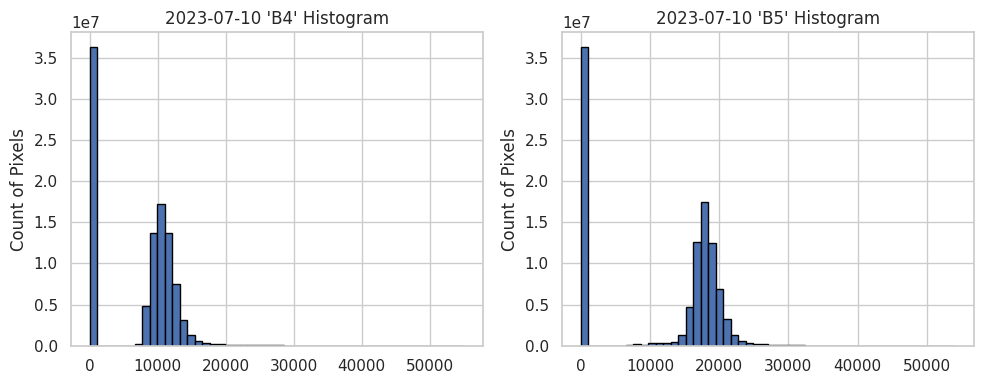

In [261]:
date1 = "2023-07-10"
date2 = "2024-01-10"

with rasterio.open(os.path.join(ndvi_input_dir, f"LC08_CU_{date1} 00:00:00_SR_B4.tif")) as src10:
    b4_10 = src10.read(1)
    transform = src10.transform
    crs = src10.crs
    bounds = src10.bounds
with rasterio.open(os.path.join(ndvi_input_dir, f"LC08_CU_{date1} 00:00:00_SR_B5.tif")) as src20:
    b5_10 = src20.read(1)

aea_proj = ccrs.AlbersEqualArea(central_longitude=-96, central_latitude=23,
                                standard_parallels=(29.5, 45.5))
# temperature1, meta = convert_to_temperature(os.path.join(Uhi_input_dir, f"LC08_CU_{date1} 00:00:00_ST_B10.tif"))     
# temp_celsius1 = kelvin_to_celsius(temperature1)
vmin, vmax = np.nanmin(b4_10), np.nanmax(b4_10)
print(f'{vmin} and {vmax}')
# temperature2, meta = convert_to_temperature(os.path.join(Uhi_input_dir, f"LC09_CU_{date2} 00:00:00_ST_B10.tif"))     
# temp_celsius2 = kelvin_to_celsius(temperature2)
vmin, vmax = np.nanmin(b5_10), np.nanmax(b5_10)
print(f'{vmin} and {vmax}')

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Urban mask histogram
axes[0].hist(b4_10.flatten(),  bins=50, edgecolor='black')
axes[0].set_title(f"{date1} 'B4' Histogram")
# axes[0].set_xticks([0,1])
# axes[0].set_xticklabels(["False","True"])
axes[0].set_ylabel("Count of Pixels")

# Rural mask histogram
axes[1].hist(b5_10.flatten(), bins=50, edgecolor='black')
axes[1].set_title(f"{date1} 'B5' Histogram")
# axes[1].set_xticks([0,1])
# axes[1].set_xticklabels(["False","True"])
axes[1].set_ylabel("Count of Pixels")

plt.tight_layout()
plt.show()

**Remove 0 as nan**

In [263]:
b4_10 = np.where(b4_10 == 0, np.nan, b4_10)  
b5_10 = np.where(b5_10 == 0, np.nan, b5_10)  

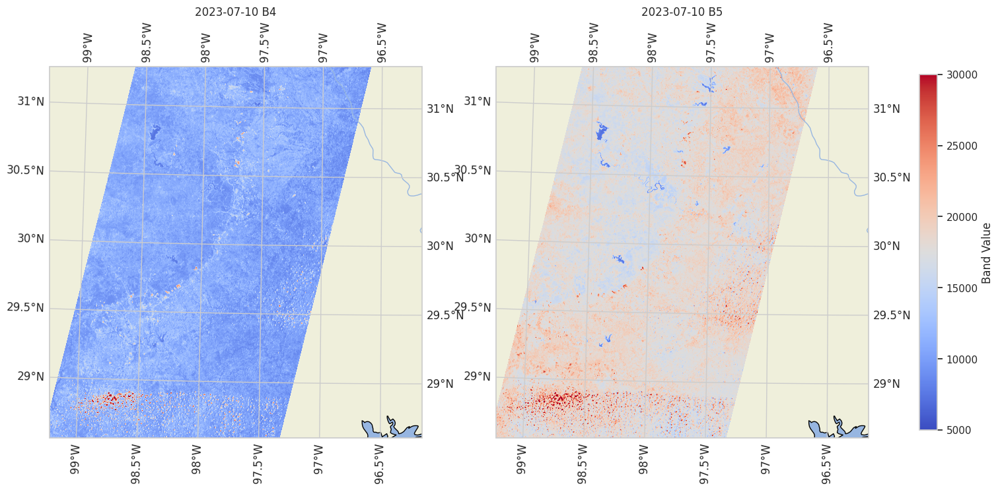

In [281]:
fig, axes = plt.subplots(1, 2, figsize=(20,10), subplot_kw={'projection': aea_proj})

# Plot the first UHI map
vmin=5000
vmax=30000
axes[0].set_extent([bounds.left, bounds.right, bounds.bottom, bounds.top], crs=aea_proj)
axes[0].coastlines()
axes[0].add_feature(cfeature.OCEAN)
axes[0].add_feature(cfeature.LAND)
axes[0].add_feature(cfeature.RIVERS)
axes[0].add_feature(cfeature.LAKES)
axes[0].add_feature(cfeature.BORDERS, linestyle='-')
axes[0].gridlines(draw_labels=True)
im1 = axes[0].imshow(b4_10, transform=aea_proj, 
    extent=rasterio.plot.plotting_extent(src10), cmap='coolwarm', vmin=vmin, vmax=vmax)
# axes[0].imshow(urban_mask, transform=aea_proj, 
#     extent=rasterio.plot.plotting_extent(src10), cmap='gray', alpha=0.2)
axes[0].set_title(f'{date1} B4')

# Plot the second UHI map

axes[1].set_extent([bounds.left, bounds.right, bounds.bottom, bounds.top], crs=aea_proj)

axes[1].gridlines(draw_labels=True)
axes[1].imshow(b5_10, transform=aea_proj, 
    extent=rasterio.plot.plotting_extent(src10), cmap='coolwarm', vmin=vmin, vmax=vmax)  # 
# axes[1].imshow(urban_mask, transform=aea_proj, 
#     extent=rasterio.plot.plotting_extent(src10), cmap='gray', alpha=0.2)
axes[1].set_title(f'{date1} B5')
axes[1].coastlines()
axes[1].add_feature(cfeature.OCEAN)
axes[1].add_feature(cfeature.LAND)
axes[1].add_feature(cfeature.RIVERS)
axes[1].add_feature(cfeature.LAKES)
axes[1].add_feature(cfeature.BORDERS, linestyle='-')

fig.colorbar(im1, ax=axes, label='Band Value', shrink=0.7)

plt.show()

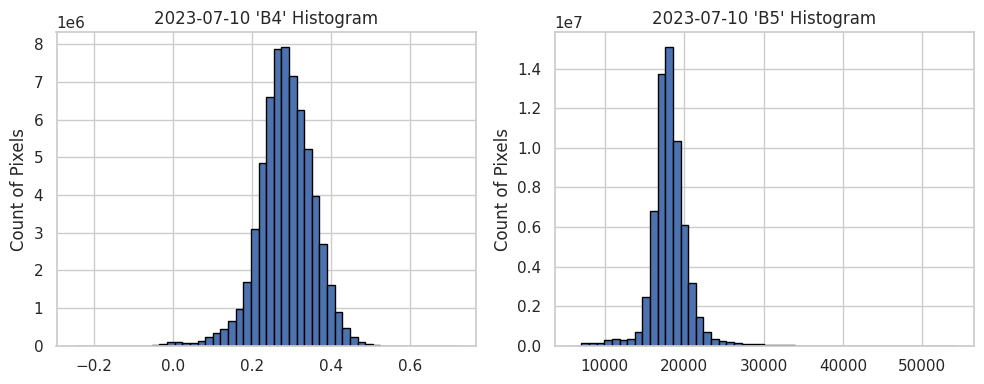

In [275]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Urban mask histogram
axes[0].hist(ndvi.flatten(),  bins=50, edgecolor='black')
axes[0].set_title(f"{date1} 'B4' Histogram")
# axes[0].set_xticks([0,1])
# axes[0].set_xticklabels(["False","True"])
axes[0].set_ylabel("Count of Pixels")

# Rural mask histogram
axes[1].hist(b5_10.flatten(), bins=50, edgecolor='black')
axes[1].set_title(f"{date1} 'B5' Histogram")
# axes[1].set_xticks([0,1])
# axes[1].set_xticklabels(["False","True"])
axes[1].set_ylabel("Count of Pixels")

plt.tight_layout()
plt.show()

#### Calculation

In [305]:
# Function to calculate NDVI
def removeBackground(data, bgvalue):
    data = np.where(data == bgvalue, np.nan, data)  
    return data
    
def calculate_ndvi(nir_file, red_file, output_file):
    with rasterio.open(nir_file) as nir_src, rasterio.open(red_file) as red_src:
        # Read NIR and Red bands
        nir = nir_src.read(1).astype('float32')
        red = red_src.read(1).astype('float32')
        nir = removeBackground(nir, 0)
        red = removeBackground(red,0)        
        # Handle division by zero
        ndvi = (nir - red) / (nir + red + 1e-10)  # Adding small value to avoid divide-by-zero
        
        # Update metadata for NDVI output
        meta = nir_src.meta.copy()
        meta.update(dtype=rasterio.float32, count=1)
        
        # Save NDVI to file
        with rasterio.open(output_file, 'w', **meta) as dst:
            dst.write(ndvi.astype(rasterio.float32), 1)
        print(f"NDVI saved to {output_file}")
        return ndvi

# Function to visualize NDVI
def visualize_ndvi(ndvi, title, save_path=None):
    plt.figure(figsize=(8, 6))
    plt.imshow(ndvi, cmap='RdYlGn', vmin=-0.5, vmax=1)  # NDVI ranges from -1 to 1
    plt.colorbar(label='NDVI Value')
    plt.title(title)
    plt.axis('off')
    if save_path:
        plt.savefig(save_path, dpi=300)
        print(f"NDVI visualization saved to {save_path}")
        plt.close()
    else:
        plt.show()

# Main workflow: Calculate and visualize NDVI
ndvi_means = []
for filename in os.listdir(ndvi_input_dir):
    if '_B5.tif' in filename:  # Identify NIR band files
        base_name = filename.replace('_B5.tif', '')  # Get base name
        nir_file = os.path.join(ndvi_input_dir, f"{base_name}_B5.tif")
        red_file = os.path.join(ndvi_input_dir, f"{base_name}_B4.tif")
        datestr = filename.split("_")[2].split()[0]   # "2023-07-10"
        output_file = os.path.join(ndvi_output_dir, f"NDVI_{datestr}.tif")
        
        if os.path.exists(nir_file) and os.path.exists(red_file):
            # Calculate NDVI
            ndvi = calculate_ndvi(nir_file, red_file, output_file)
            vmin = np.nanmin(ndvi)
            vmax = np.nanmax(vmax)
            print(f'min is {np.nanmin(ndvi)}, max is {np.nanmax(ndvi)}')
            ndvi_mean = np.nanmean(ndvi)
            ndvi_means.append(ndvi_mean)
            # Visualize NDVI
            visual_path = os.path.join(ndvi_visual_dir, f"NDVI_{datestr}.png")
            visualize_ndvi(ndvi, title=f"NDVI: {base_name}", save_path=visual_path)
            


NDVI saved to ./Data/NDVI_analysis/output/NDVI_2023-06-16.tif
min is -0.2454828917980194, max is 0.7185618877410889
NDVI visualization saved to ./Data/NDVI_analysis/visuals/NDVI_2023-06-16.png
NDVI saved to ./Data/NDVI_analysis/output/NDVI_2023-08-11.tif
min is -0.3946825861930847, max is 0.7156564593315125
NDVI visualization saved to ./Data/NDVI_analysis/visuals/NDVI_2023-08-11.png
NDVI saved to ./Data/NDVI_analysis/output/NDVI_2023-09-20.tif
min is -0.34989649057388306, max is 0.7635683417320251
NDVI visualization saved to ./Data/NDVI_analysis/visuals/NDVI_2023-09-20.png
NDVI saved to ./Data/NDVI_analysis/output/NDVI_2024-01-10.tif
min is -0.3718935549259186, max is 0.9818682670593262
NDVI visualization saved to ./Data/NDVI_analysis/visuals/NDVI_2024-01-10.png
NDVI saved to ./Data/NDVI_analysis/output/NDVI_2023-07-18.tif
min is -0.3633427023887634, max is 0.7384659051895142
NDVI visualization saved to ./Data/NDVI_analysis/visuals/NDVI_2023-07-18.png
NDVI saved to ./Data/NDVI_analysis

In [306]:
ndvi_means

[0.28627288,
 0.21060106,
 0.18929903,
 0.20042643,
 0.23254089,
 0.22655265,
 0.19872111,
 0.2147938,
 0.20305115,
 0.24284276]

2023-07-10 min: -0.39569827914237976, max: 0.7254922986030579
2024-01-10 min: -0.3718935549259186, max: 0.9818682670593262


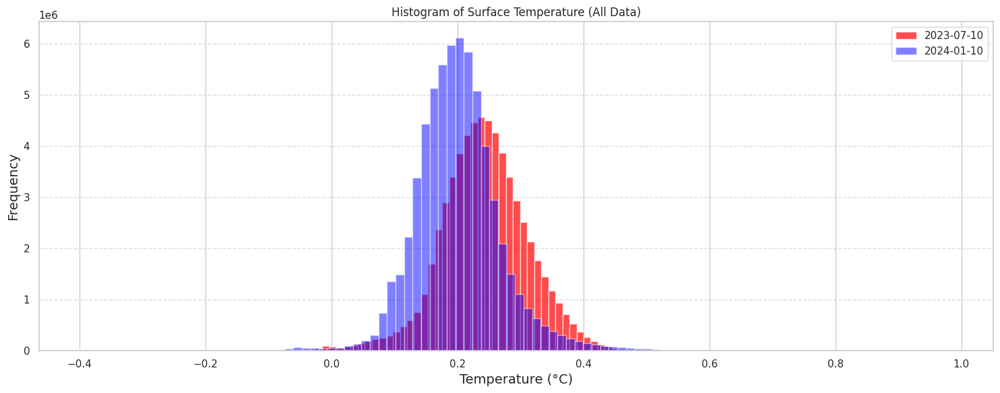

In [300]:
with rasterio.open(os.path.join(ndvi_output_dir, f"NDVI_{date1}.tif")) as src1:
    ndvi1 = src1.read(1)
    transform = src1.transform
    crs = src1.crs
    bounds = src1.bounds
with rasterio.open(os.path.join(ndvi_output_dir, f"NDVI_{date2}.tif")) as src2:
    ndvi2 = src2.read(1)
flattened_data = ndvi1.flatten()
flattened_data2 = ndvi2.flatten()
print(f'{date1} min: {np.nanmin(flattened_data)}, max: {np.nanmax(flattened_data)}')
print(f'{date2} min: {np.nanmin(flattened_data2)}, max: {np.nanmax(flattened_data2)}')
fig, axes = plt.subplots(1, 1, figsize=(15, 6))

# Plot the whole histogram on the left
axes.hist(flattened_data, bins=100, color='red', alpha=0.7, label=date1)
axes.hist(flattened_data2, bins=100, color='blue', alpha=0.5, label=date2)
axes.set_xlabel("Temperature (°C)", fontsize=14)
axes.set_ylabel("Frequency", fontsize=14)
axes.set_title('Histogram of Surface Temperature (All Data)')
# axes.set_xlim([-0.1,0.6])
axes.legend()
axes.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust the layout and show the plot
plt.tight_layout()
plt.show()    

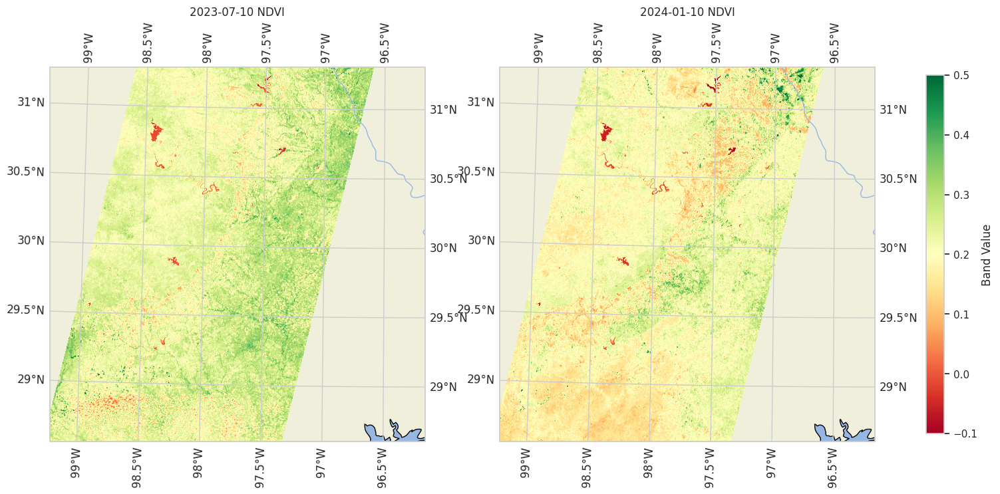

In [298]:
   
fig, axes = plt.subplots(1, 2, figsize=(20,10), subplot_kw={'projection': aea_proj})

# Plot the first UHI map
vmin=-0.1
vmax=0.5
axes[0].set_extent([bounds.left, bounds.right, bounds.bottom, bounds.top], crs=aea_proj)
axes[0].coastlines()
axes[0].add_feature(cfeature.OCEAN)
axes[0].add_feature(cfeature.LAND)
axes[0].add_feature(cfeature.RIVERS)
axes[0].add_feature(cfeature.LAKES)
axes[0].add_feature(cfeature.BORDERS, linestyle='-')
axes[0].gridlines(draw_labels=True)
im1 = axes[0].imshow(ndvi1, transform=aea_proj, 
    extent=rasterio.plot.plotting_extent(src1), cmap='RdYlGn', vmin=vmin, vmax=vmax)
# axes[0].imshow(urban_mask, transform=aea_proj, 
#     extent=rasterio.plot.plotting_extent(src10), cmap='gray', alpha=0.2)
axes[0].set_title(f'{date1} NDVI')

# Plot the second UHI map

axes[1].set_extent([bounds.left, bounds.right, bounds.bottom, bounds.top], crs=aea_proj)

axes[1].gridlines(draw_labels=True)
axes[1].imshow(ndvi2, transform=aea_proj, 
    extent=rasterio.plot.plotting_extent(src1), cmap='RdYlGn', vmin=vmin, vmax=vmax)  # 
# axes[1].imshow(urban_mask, transform=aea_proj, 
#     extent=rasterio.plot.plotting_extent(src10), cmap='gray', alpha=0.2)
axes[1].set_title(f'{date2} NDVI')
axes[1].coastlines()
axes[1].add_feature(cfeature.OCEAN)
axes[1].add_feature(cfeature.LAND)
axes[1].add_feature(cfeature.RIVERS)
axes[1].add_feature(cfeature.LAKES)
axes[1].add_feature(cfeature.BORDERS, linestyle='-')

fig.colorbar(im1, ax=axes, label='Band Value', shrink=0.7)

plt.show()

GIF saved to ./Data/NDVI_analysis/NDVI_3D_animation.gif


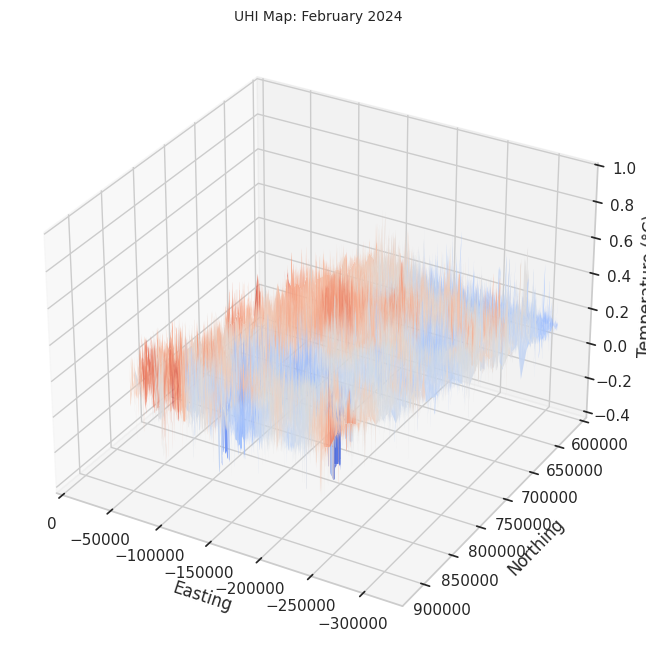

In [302]:
output_gif = "./Data/NDVI_analysis/NDVI_3D_animation.gif"
create_3d_animation(ndvi_output_dir, output_gif, duration=500)

### 3. UHI and NDVI analysis

Correlation between UHI and NDVI over time: 0.34631328387082494


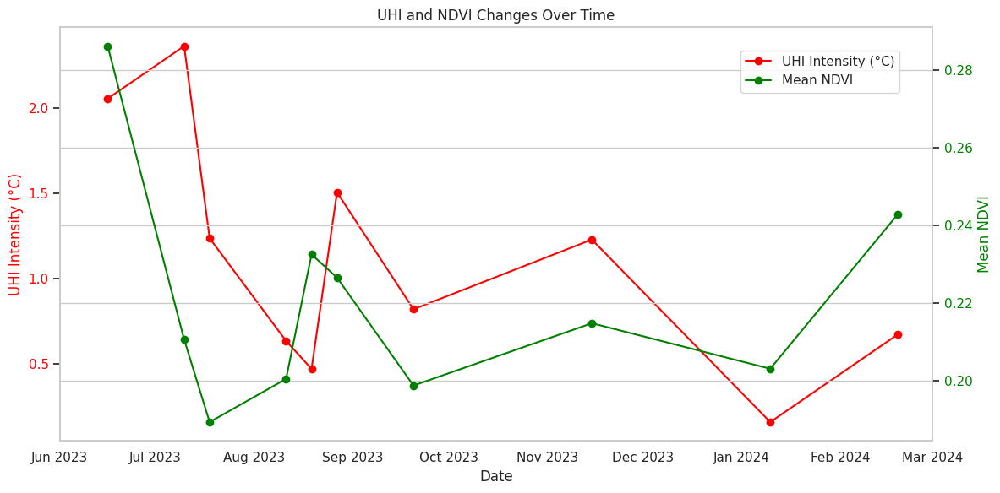

In [413]:

correlation = np.corrcoef(uhi_intensities, ndvi_means)[0, 1]
print(f"Correlation between UHI and NDVI over time: {correlation}")
datestime = [datetime.strptime(date, "%Y-%m-%d") for date in dates]
# Set up the plot
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot UHI intensities on the left y-axis
ax1.plot(datestime, uhi_intensities, color="red", marker="o", label="UHI Intensity (°C)")
ax1.set_xlabel("Date")
ax1.set_ylabel("UHI Intensity (°C)", color="red")
ax1.tick_params(axis="y", labelcolor="red")
ax1.grid()
# Create a second y-axis for NDVI means
ax2 = ax1.twinx()
ax2.plot(datestime, ndvi_means, color="green", marker="o", label="Mean NDVI")
ax2.set_ylabel("Mean NDVI", color="green")
ax2.tick_params(axis="y", labelcolor="green")

# Set the x-axis to display monthly ticks from June 1, 2023, to March 1, 2024
start_date = datetime(2023, 6, 1)
end_date = datetime(2024, 3, 1)
ax1.set_xlim([start_date, end_date])
ax1.xaxis.set_major_locator(mdates.MonthLocator())  # Major ticks every month
ax1.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))  # Format as 'Month Year'

# Rotate the x-axis labels for better visibility
plt.xticks(rotation=45)

# Title and layout adjustments
plt.title("UHI and NDVI Changes Over Time")
fig.tight_layout()  # Adjust layout to fit elements properly

# Add legends for both curves
fig.legend(loc="upper right", bbox_to_anchor=(0.9, 0.9))

# Show the plot
plt.show()

**Observation**
1. Both UHI and MDVI are higher in summer and lower in winter.
2. In spring and summer, vegetation tends to grow more actively due to favorable temperature, sunlight, and precipitation, so NDVI results in higher in spring and summer.
3. In fall and winter, vegetation becomes dormant or sheds leaves, leading to lower NDVI values. Snow cover can also reduce NDVI in winter.
4. It is interesting to see the NDVI is syned with UHI in winter, but a step faster than in summer. It means seasonal changes in NDVI (e.g., due to vegetation cycles) have a lagged effect on UHI in summer than in winter!

In [337]:
hotspot_output_dir = "./Data/hotspot_outputs"  # Directory to save hotspot maps
os.makedirs(hotspot_output_dir, exist_ok=True)

In [368]:

# Parameters
UHI_threshold = 10  # threshold for high UHI
NDVI_threshold = 0.2  # threshold for low NDVI
hotspot_output_dir = "./Data/hotspot_analysis"  # Directory to save hotspot maps
os.makedirs(hotspot_output_dir, exist_ok=True)

def identify_hotspots(UHIpath, NDVIpath, dates, UHI_threshold, NDVI_threshold, output_dir):
    for date in dates:
        # File paths
        UHI_file = os.path.join(UHIpath, f"UHI_{date}.tif")
        NDVI_file = os.path.join(NDVIpath, f"NDVI_{date}.tif")
        hotspot_file = os.path.join(output_dir, f"Hotspot_{date}.tif")
        
        # Open UHI and NDVI raster files
        with rasterio.open(UHI_file) as UHI_src, rasterio.open(NDVI_file) as NDVI_src:
            UHI_data = UHI_src.read(1)
            NDVI_data = NDVI_src.read(1)
            
            # Ensure UHI and NDVI data align
            if UHI_src.shape != NDVI_src.shape:
                raise ValueError(f"Shape mismatch for date {date}: UHI {UHI_src.shape} vs NDVI {NDVI_src.shape}")
            
            # Identify hotspot areas: High UHI and Low NDVI
            hotspot_map = np.where(
                (UHI_data > UHI_threshold) & (NDVI_data < NDVI_threshold),
                1,  # Mark as hotspot
                0   # Non-hotspot
            )
            print(np.sum(hotspot_map))
            # Save the hotspot map as a GeoTIFF
            meta = UHI_src.meta.copy()
            
            meta.update(dtype=rasterio.uint8, count=1, nodata=0)
            with rasterio.open(hotspot_file, "w", **meta) as dst:
                dst.write(hotspot_map.astype(rasterio.uint8), 1)
            
            print(f"Hotspot map saved for date {date} to {hotspot_file}")


identify_hotspots(os.path.join(uhi_dir, 'output'), os.path.join(ndvi_dir, 'output'), dates, UHI_threshold, NDVI_threshold, hotspot_output_dir)


218293
Hotspot map saved for date 2023-06-16 to ./Data/hotspot_analysis/Hotspot_2023-06-16.tif
1479747
Hotspot map saved for date 2023-07-10 to ./Data/hotspot_analysis/Hotspot_2023-07-10.tif
330458
Hotspot map saved for date 2023-07-18 to ./Data/hotspot_analysis/Hotspot_2023-07-18.tif
124281
Hotspot map saved for date 2023-08-11 to ./Data/hotspot_analysis/Hotspot_2023-08-11.tif
433103
Hotspot map saved for date 2023-08-19 to ./Data/hotspot_analysis/Hotspot_2023-08-19.tif
268620
Hotspot map saved for date 2023-08-27 to ./Data/hotspot_analysis/Hotspot_2023-08-27.tif
80947
Hotspot map saved for date 2023-09-20 to ./Data/hotspot_analysis/Hotspot_2023-09-20.tif
9170
Hotspot map saved for date 2023-11-15 to ./Data/hotspot_analysis/Hotspot_2023-11-15.tif
10079
Hotspot map saved for date 2024-01-10 to ./Data/hotspot_analysis/Hotspot_2024-01-10.tif
19427
Hotspot map saved for date 2024-02-19 to ./Data/hotspot_analysis/Hotspot_2024-02-19.tif


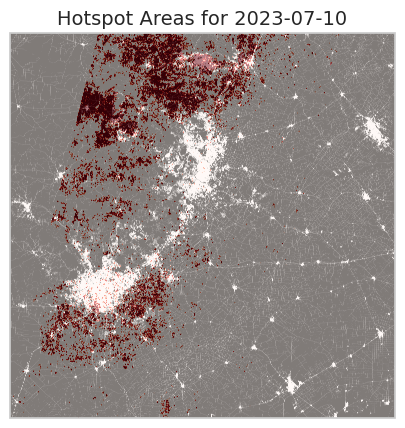

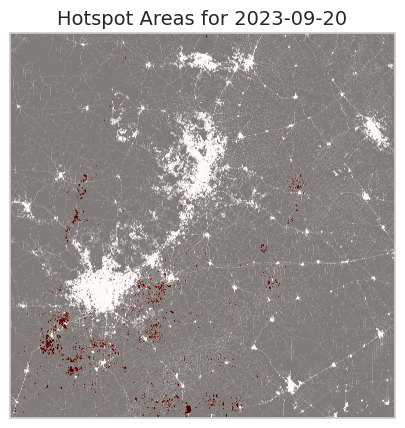

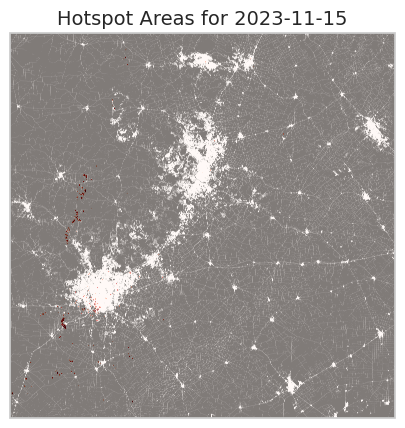

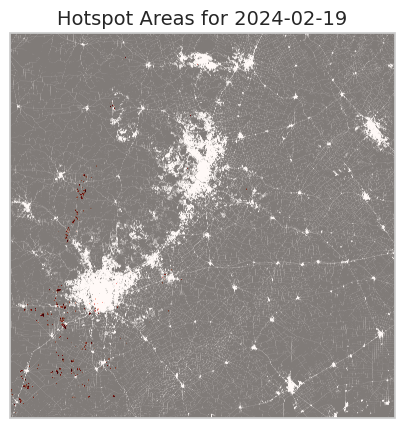

In [387]:
from scipy.ndimage import binary_dilation
def plot_hotspots(hotspot_file, date):
    with rasterio.open(hotspot_file) as src:
        hotspot_data = src.read(1)
        transform = src.transform
        
        # Identify non-zero areas (hotspots)
    hotspot_mask = hotspot_data > 0
    dilation_iterations=10
    enlarged_hotspot_mask = binary_dilation(hotspot_mask, iterations=dilation_iterations)        
    
    # Check if there are hotspots to display
    if not np.any(hotspot_mask):
        print(f"No hotspots detected for {date}.")
        return        

    fig, ax = plt.subplots(figsize=(5, 5), subplot_kw={'projection': aea_proj})
    ax.set_extent([bounds.left, bounds.right, bounds.bottom, bounds.top], crs=aea_proj)
 
    ax.imshow(enlarged_hotspot_mask, transform=aea_proj, extent=rasterio.plot.plotting_extent(src), 
              cmap="Reds")
    ax.imshow(urban_mask, transform=aea_proj, extent=rasterio.plot.plotting_extent(src), 
              cmap="gray", alpha=0.5)
    ax.set_title(f"Hotspot Areas for {date}", fontsize=14)
  
    plt.show()

datesSpots = ["2023-07-10", "2023-09-20","2023-11-15","2024-02-19"]
for date in datesSpots:
    hotspot_file = os.path.join(hotspot_output_dir, f"Hotspot_{date}.tif")
    plot_hotspots(hotspot_file, date)
    


**Observation**
1. The hotspots are on places not on the urban area, but on open water, and deciduous forest!
2. There are more areas where 


### 4. Land Cover Classification
Objective: Classify land cover into categories such as urban, vegetation, and water.

Steps:
Stack Relevant Bands:

Use bands like B2 (Blue), B3 (Green), B4 (Red), and B5 (NIR).
Prepare Training Data:

Create labeled data for different land cover types (e.g., urban, vegetation, water).
Train a Classification Model:

Use machine learning classifiers such as Random Forest or Support Vector Machines (SVM).
Alternatively, use unsupervised clustering (e.g., K-Means) for automatic classification.
Predict and Visualize:

Classify land cover across the mosaics and generate maps.

In [28]:


# Define the LCC input path and output folder
lcc_inputdir = os.path.join(lcc_dir, 'input')
lcc_outputdir = os.path.join(lcc_dir, 'output')



# Get all files in the directory
all_files = os.listdir(lcc_inputdir)

# Group files by date and sensor (LC08, LC09)
data_by_date = {}
for filename in all_files:
    if filename.endswith(".tif"):
        # Extract the date from the filename
        parts = filename.split("_")
        sensor = parts[0]  # LC08 or LC09
        date_str = parts[2]  # Example: 2023-06-16
        date_only = date_str.split(" ")[0]
        date = datetime.strptime(date_only, "%Y-%m-%d").date()

        # Group by sensor and date
        key = (sensor, date)
        if key not in data_by_date:
            data_by_date[key] = []
        data_by_date[key].append(os.path.join(lcc_inputdir, filename))

# Process each group (sensor + date)
for (sensor, date), files in data_by_date.items():
    # Sort files to ensure Band 1 to Band 7 order
    files.sort(key=lambda x: int(x.split("_SR_B")[-1].split(".tif")[0]))

    # Output file for the stacked bands
    output_file = os.path.join(lcc_outputdir, f"LCC_{date}.tif")

    # Stack the bands
    with rasterio.open(files[0]) as src:
        meta = src.meta.copy()
        meta.update(count=len(files))  # Update metadata to match number of bands

    with rasterio.open(output_file, "w", **meta) as dest:
        for idx, band_file in enumerate(files, start=1):
            with rasterio.open(band_file) as src:
                band_data = src.read(1).astype('float32')  # Ensure float type for NaN
                band_data[band_data == 0] = np.nan  # Replace 0 with NaN
                dest.write(band_data, idx)

    print(f"Stacked file created: {output_file}")


Stacked file created: ./Data/LCC_analysis/output/LCC_2023-06-16.tif
Stacked file created: ./Data/LCC_analysis/output/LCC_2023-08-19.tif
Stacked file created: ./Data/LCC_analysis/output/LCC_2023-07-18.tif
Stacked file created: ./Data/LCC_analysis/output/LCC_2023-08-11.tif
Stacked file created: ./Data/LCC_analysis/output/LCC_2024-01-10.tif
Stacked file created: ./Data/LCC_analysis/output/LCC_2023-08-27.tif
Stacked file created: ./Data/LCC_analysis/output/LCC_2023-09-20.tif
Stacked file created: ./Data/LCC_analysis/output/LCC_2023-11-15.tif
Stacked file created: ./Data/LCC_analysis/output/LCC_2024-02-19.tif
Stacked file created: ./Data/LCC_analysis/output/LCC_2023-07-10.tif


#### Analysis

Analyzing ./Data/LCC_analysis/output/LCC_2023-07-10.tif...
Statistics for LCC_2023-07-10.tif:
Band 1: Mean=5633.59, Max=52107, Min=0
Band 2: Mean=5963.08, Max=52287, Min=0
Band 3: Mean=6813.66, Max=55095, Min=0
Band 4: Mean=7088.18, Max=55098, Min=0
Band 5: Mean=11569.22, Max=54105, Min=0
Band 6: Mean=11275.26, Max=56659, Min=0
Band 7: Mean=8743.48, Max=59912, Min=0


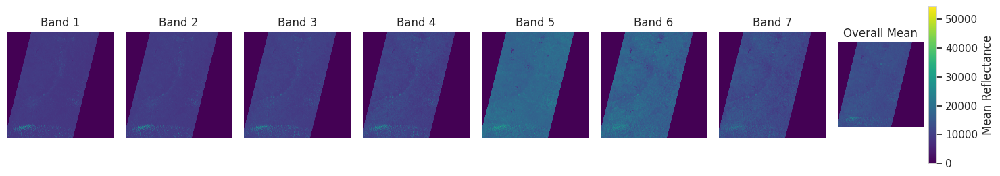

Analyzing ./Data/LCC_analysis/output/LCC_2024-01-10.tif...
Statistics for LCC_2024-01-10.tif:
Band 1: Mean=5525.89, Max=38869, Min=0
Band 2: Mean=5765.53, Max=41223, Min=0
Band 3: Mean=6363.95, Max=45296, Min=0
Band 4: Mean=6558.10, Max=49705, Min=0
Band 5: Mean=9893.85, Max=53363, Min=0
Band 6: Mean=10198.11, Max=65454, Min=0
Band 7: Mean=8430.67, Max=65454, Min=0


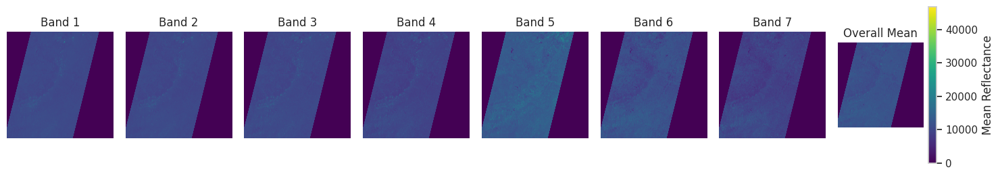

Analyzing ./Data/LCC_analysis/output/LCC_2023-08-19.tif...
Statistics for LCC_2023-08-19.tif:
Band 1: Mean=5761.92, Max=42994, Min=0
Band 2: Mean=6174.12, Max=43501, Min=0
Band 3: Mean=7115.12, Max=44182, Min=0
Band 4: Mean=7785.31, Max=50860, Min=0
Band 5: Mean=11679.48, Max=56296, Min=0
Band 6: Mean=12162.25, Max=58707, Min=0
Band 7: Mean=9436.72, Max=61497, Min=0


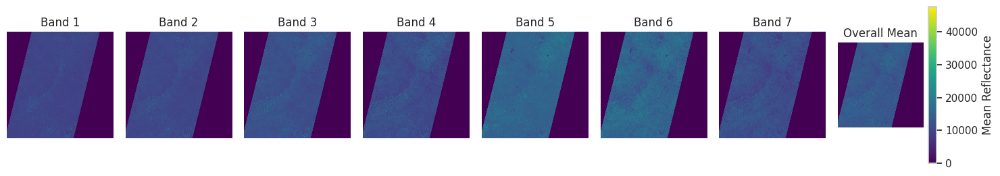

Analyzing ./Data/LCC_analysis/output/LCC_2023-08-27.tif...
Statistics for LCC_2023-08-27.tif:
Band 1: Mean=5699.58, Max=40251, Min=0
Band 2: Mean=6074.31, Max=40559, Min=0
Band 3: Mean=6949.52, Max=42930, Min=0
Band 4: Mean=7510.49, Max=46932, Min=0
Band 5: Mean=11180.97, Max=56798, Min=0
Band 6: Mean=11903.03, Max=59571, Min=0
Band 7: Mean=9283.93, Max=62446, Min=0


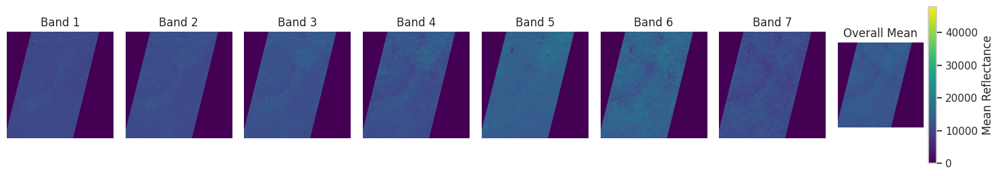

Analyzing ./Data/LCC_analysis/output/LCC_2023-11-15.tif...
Statistics for LCC_2023-11-15.tif:
Band 1: Mean=5413.68, Max=46309, Min=0
Band 2: Mean=5588.64, Max=47342, Min=0
Band 3: Mean=6167.85, Max=56367, Min=0
Band 4: Mean=6215.51, Max=62990, Min=0
Band 5: Mean=9879.69, Max=64814, Min=0
Band 6: Mean=9737.31, Max=65454, Min=0
Band 7: Mean=7815.65, Max=65454, Min=0


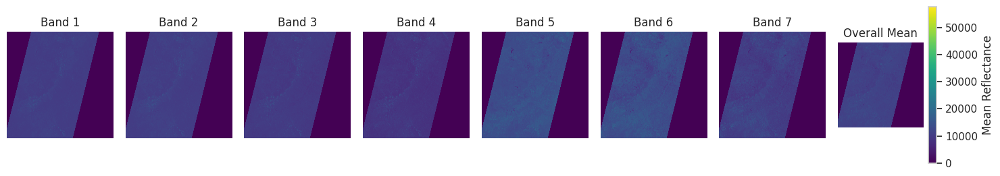

Analyzing ./Data/LCC_analysis/output/LCC_2023-06-16.tif...
Statistics for LCC_2023-06-16.tif:
Band 1: Mean=5458.91, Max=32054, Min=0
Band 2: Mean=5745.46, Max=36673, Min=0
Band 3: Mean=6587.05, Max=43535, Min=0
Band 4: Mean=6546.20, Max=53800, Min=0
Band 5: Mean=11799.54, Max=52939, Min=0
Band 6: Mean=10627.73, Max=56260, Min=0
Band 7: Mean=8192.19, Max=58710, Min=0


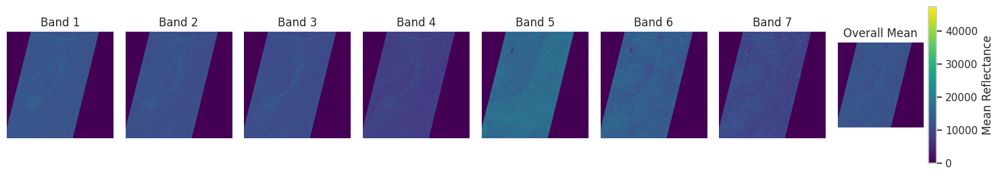

Analyzing ./Data/LCC_analysis/output/LCC_2023-07-18.tif...
Statistics for LCC_2023-07-18.tif:
Band 1: Mean=5608.97, Max=51692, Min=0
Band 2: Mean=5965.97, Max=52475, Min=0
Band 3: Mean=6844.47, Max=55582, Min=0
Band 4: Mean=7241.51, Max=55633, Min=0
Band 5: Mean=11577.35, Max=54560, Min=0
Band 6: Mean=11569.81, Max=57128, Min=0
Band 7: Mean=8989.18, Max=59792, Min=0


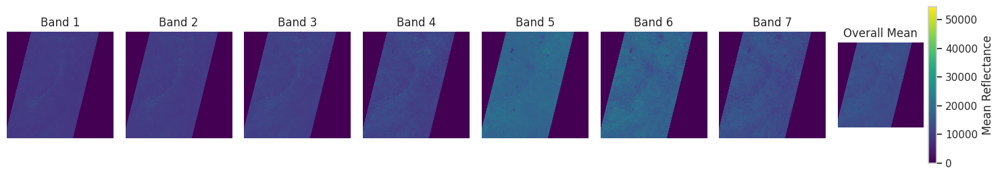

Analyzing ./Data/LCC_analysis/output/LCC_2023-08-11.tif...
Statistics for LCC_2023-08-11.tif:
Band 1: Mean=5697.86, Max=46661, Min=0
Band 2: Mean=6091.54, Max=49269, Min=0
Band 3: Mean=7029.01, Max=44706, Min=0
Band 4: Mean=7654.59, Max=52862, Min=0
Band 5: Mean=11658.43, Max=55536, Min=0
Band 6: Mean=11996.92, Max=58237, Min=0
Band 7: Mean=9276.27, Max=60779, Min=0


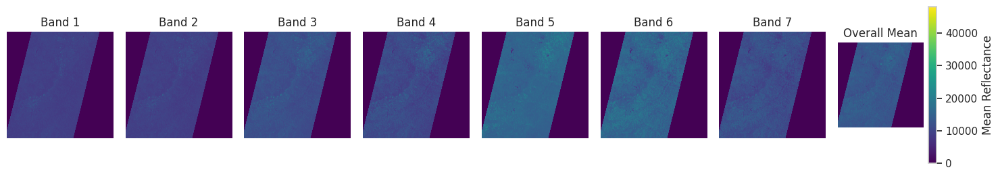

Analyzing ./Data/LCC_analysis/output/LCC_2024-02-19.tif...
Statistics for LCC_2024-02-19.tif:
Band 1: Mean=5572.35, Max=34773, Min=0
Band 2: Mean=5769.13, Max=38538, Min=0
Band 3: Mean=6400.18, Max=43621, Min=0
Band 4: Mean=6523.37, Max=47577, Min=0
Band 5: Mean=10150.41, Max=64782, Min=0
Band 6: Mean=10382.75, Max=65454, Min=0
Band 7: Mean=8537.63, Max=65454, Min=0


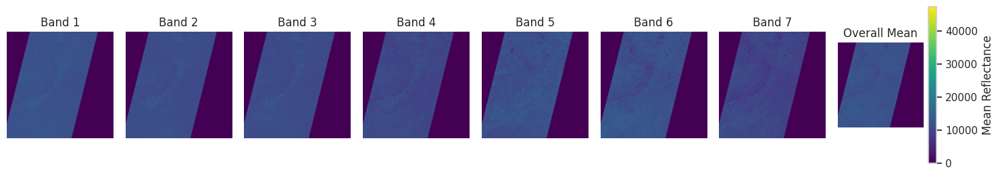

Analyzing ./Data/LCC_analysis/output/LCC_2023-09-20.tif...
Statistics for LCC_2023-09-20.tif:
Band 1: Mean=5720.16, Max=42942, Min=0
Band 2: Mean=6030.08, Max=44666, Min=0
Band 3: Mean=6766.23, Max=44147, Min=0
Band 4: Mean=7184.77, Max=50718, Min=0
Band 5: Mean=10497.69, Max=55950, Min=0
Band 6: Mean=11574.07, Max=63137, Min=0
Band 7: Mean=9247.84, Max=65454, Min=0


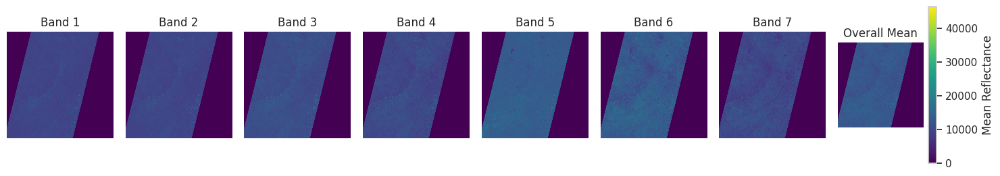

In [402]:

# Function to analyze a single stacked LCC file
def analyze_lcc(file_path):
    with rasterio.open(file_path) as src:
        # Read all bands
        data = src.read()
        metadata = src.meta
        
        # Calculate per-band statistics
        stats = {}
        for band_idx in range(data.shape[0]):
            band_data = data[band_idx]
            stats[f"Band {band_idx + 1}"] = {
                "mean": np.nanmean(band_data),
                "max": np.nanmax(band_data),
                "min": np.nanmin(band_data),
            }
        
        # Calculate overall mean across all bands
        overall_mean = np.nanmean(data, axis=0)
        
    return stats, overall_mean, metadata

# Function to visualize a specific band or the overall mean
def visualize_lcc(file_path, overall_mean=None):
    with rasterio.open(file_path) as src:
        fig, axes = plt.subplots(1, src.count + 1, figsize=(15, 5))
        
        for band_idx in range(1, src.count + 1):
            band_data = src.read(band_idx)
            axes[band_idx - 1].imshow(band_data, cmap="viridis")
            axes[band_idx - 1].set_title(f"Band {band_idx}")
            axes[band_idx - 1].axis("off")
        
        # Plot overall mean if provided
        if overall_mean is not None:
            im = axes[-1].imshow(overall_mean, cmap="viridis")
            axes[-1].set_title("Overall Mean")
            axes[-1].axis("off")
            fig.colorbar(im, ax=axes[-1], shrink=0.5, label="Mean Reflectance")
        
        plt.tight_layout()
        plt.show()


# Analyze and visualize each LCC file
for lcc_file in os.listdir(lcc_outputdir):
    if lcc_file.endswith(".tif"):
        file_path = os.path.join(lcc_outputdir, lcc_file)
        print(f"Analyzing {file_path}...")
        
        # Perform analysis
        stats, overall_mean, metadata = analyze_lcc(file_path)
        
        # Print summary statistics
        print(f"Statistics for {lcc_file}:")
        for band, band_stats in stats.items():
            print(f"{band}: Mean={band_stats['mean']:.2f}, Max={band_stats['max']}, Min={band_stats['min']}")
        
        # Visualize
        visualize_lcc(file_path, overall_mean)


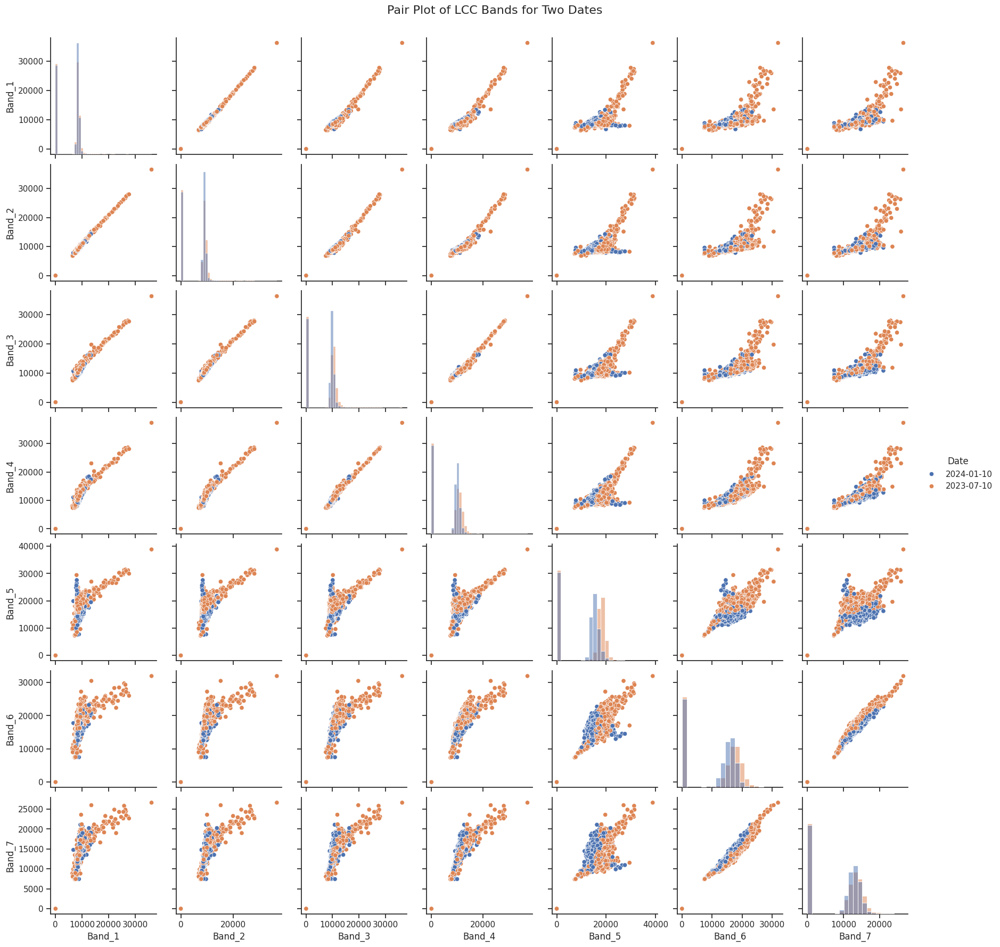

In [33]:
import rasterio
from rasterio.enums import Resampling
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import numpy as np


def downsample_raster(file, scale_factor=10):
    """Downsample a raster by a given scale factor."""
    with rasterio.open(file) as src:
        # Calculate the new dimensions
        new_height = src.height // scale_factor
        new_width = src.width // scale_factor
        
        # Perform the resampling
        data = src.read(
            out_shape=(src.count, new_height, new_width),
            resampling=Resampling.average
        )
        
        return data

# Define the LCC directory and specific dates to analyze
dates_to_plot = [date1, date2]  # Replace with your two dates
data_frames = []

for date in dates_to_plot:
    lcc_file = os.path.join(lcc_outputdir, f'LCC_{date}.tif')
    
    # Downsample the raster
    downsampled_bands = downsample_raster(lcc_file, scale_factor=10)
    
    # Flatten bands and create a DataFrame for this date
    df = pd.DataFrame({
        f"Band_{i+1}": downsampled_bands[i].flatten()
        for i in range(downsampled_bands.shape[0])
    })
    df['Date'] = str(date)  # Ensure 'Date' is added as a string column
    data_frames.append(df)

# Combine data for the two dates
combined_df = pd.concat(data_frames, ignore_index=True)

# Drop NaN values
combined_df = combined_df.dropna()

# Sample data for faster plotting
sampled_df = combined_df.sample(n=10000, random_state=42)  # Adjust sample size as needed

# Pair Plot with the two dates
sns.set(style="ticks")
pair_plot = sns.pairplot(
    sampled_df,
    vars=[f"Band_{i}" for i in range(1, 8)],  # Select the first 7 bands
    diag_kind="hist",
    hue="Date",  # Use 'Date' for coloring
    height=2.5
)
pair_plot.fig.suptitle("Pair Plot of LCC Bands for Two Dates", y=1.02, fontsize=16)
pair_plot.savefig("pairplot_lcc_two_dates.png")
plt.show()


Observations:

- Correlation Between Bands:
        There are strong linear relationships between certain bands (e.g., Band 4 and Band 5, Band 3 and Band 4).
        This indicates that some bands may contain redundant information or are capturing similar features.

- Seasonal Differences:
        The pair plot shows two distinct clusters of points, which correspond to the two dates (2023-07-10 and 2024-01-10). These clusters highlight how the spectral reflectance of the same locations differs between summer and winter.
        For example, the orange points (2024-01-10, winter) and blue points (2023-07-10, summer) are separated in certain bands like Band 5 and Band 7. This separation could be caused by vegetation senescence, snow cover, or changes in surface conditions.

- Outliers:
        Some points deviate significantly from the linear trends observed in the scatter plots. These may represent:
            Areas with unique features (e.g., urban areas, water bodies).
            Data inconsistencies or errors.

- Band-Specific Variations:
        Certain bands (e.g., Band 1 and Band 7) show more spread in their distributions, indicating higher variability in the reflectance values for those wavelengths.
        This might suggest that these bands are sensitive to specific land cover types or atmospheric effects.

- Seasonal Shifts in Band Values:
        The overall distribution of band values shifts slightly between the two dates, which aligns with expected seasonal changes:
            Vegetation might reflect more in the NIR (Band 5) during summer due to healthy vegetation.
            Snow or reduced vegetation cover during winter could impact reflectance values in bands sensitive to vegetation or soil.

Insights:

- Land Cover Analysis:
        The clustering pattern and linear correlations suggest that certain bands could be more useful for distinguishing land cover types.
        Bands with minimal overlap between dates (e.g., Band 4 and Band 5) might be crucial for detecting seasonal land cover changes.

- Impact of Seasons on Reflectance:
        Differences between the clusters indicate how seasonal changes (e.g., vegetation health, snow cover) impact reflectance values.
        This could help identify areas with significant seasonal variability, which might be urban hotspots or agricultural fields.

- Potential for Dimensionality Reduction:
        Strong correlations between some bands suggest redundancy. Techniques like Principal Component Analysis (PCA) or band selection could reduce the dataset's dimensionality without losing much information.

- Need for Further Analysis:
        Outliers could be further investigated to identify unique areas or data inconsistencies.
        Combining this analysis with NDVI or UHI data could reveal relationships between spectral characteristics and thermal or vegetation indices.

## Conclusions
Summary:
1. Urban Heat Island (UHI) Analysis

    - Temporal UHI Trends:
        Generated and visualized UHI maps for multiple dates across different seasons.
        Identified significant seasonal variations in UHI intensity, with higher intensity during summer.
        Highlighted spatial patterns in UHI, showing urban areas as hotspots with higher temperature contrasts.

    - Hotspot Analysis:
        Identified and mapped areas with high UHI intensity (hotspots).
        Detected hotspots primarily in urban and transitional zones during summer months, with almost negligible hotspots in winter.

    - Temporal UHI Intensity Curve:
        Created time-series analysis of UHI intensity, showing seasonal trends.
        Observed a peak in UHI during summer and reduced intensity during winter.

2. NDVI Analysis

    - NDVI Maps:
        Derived and visualized NDVI maps to track vegetation health over time.
        Highlighted seasonal variations, with higher NDVI during summer months.

    - NDVI Temporal Curve:
        Created time-series plots of NDVI mean values across multiple dates, showing vegetation trends in urban and rural areas.
3. Combined UHI-NDVI Analysis

    - Urban Development Heat Island (UDHI) Derivation:
        Merged UHI and NDVI data to assess the combined effect of urban heat and vegetation cover.
        Identified areas where UHI intensity is high, and NDVI is low, signaling critical urban areas with minimal vegetation.

    - Hotspot Overlay with Land Cover:
        Overlaid UHI and NDVI hotspots with LCC maps to pinpoint areas of concern (e.g., urban regions lacking vegetation).
        Highlighted critical zones for potential urban planning or reforestation initiatives.

4. Land Category (LCC) Analysis

    - Land Cover Classification (LCC):
        Stacked reflectance bands (B1-B7) from multiple satellite images into multi-band raster files.
        Applied classification techniques to categorize land cover into urban, vegetation, water, and other classes.

    - Land Cover Maps:
        Generated land cover category maps for multiple dates with a well-differentiated color scheme.
        Visualized spatial distributions of different land categories, highlighting urban and vegetated areas.
  
5. Combined UHI-LCC Analysis

    - Seasonal Band Analysis:
        Explored relationships between reflectance bands (B1-B7) using pair plots across multiple dates.
        Identified strong correlations between bands and seasonal shifts in reflectance values.

    - Integration with UHI and NDVI:
        Analyzed relationships between spectral data (LCC bands) and UHI/NDVI to investigate environmental and urban impacts.
        Observed seasonal trends, showing how land cover changes (e.g., vegetation) impact UHI intensity.      

# Future Work
Expand to more datasets or include additional cities.
Integrate virtual/augmented reality for immersive exploration of future scenarios.
Develop a deployable application or API for real-time climate prediction.

### Deep Learning Analysis:

1. For LCC analysis:
Classify land cover into categories such as urban, vegetation, and water.

Steps:
- Stack Relevant Bands:
Use bands like B2 (Blue), B3 (Green), B4 (Red), and B5 (NIR).

- Prepare Training Data:
Create labeled data for different land cover types (e.g., urban, vegetation, water).


- Train a Classification Model:

- Use machine learning classifiers such as Random Forest or Support Vector Machines (SVM).
Alternatively, use unsupervised clustering (e.g., K-Means) for automatic classification.
- Predict and Visualize:
Classify land cover across the mosaics and generate maps.


2. Train a U-Net model for semantic segmentation of urban areas and vegetation.
Use LSTMs or Transformers for temporal climate modeling (e.g., predicting rainfall or extreme weather trends).

Exploratory Data Analysis:
Visualize spatial and temporal trends using matplotlib, seaborn, holoviews.
Create interactive maps with folium or plotly.

Supervised Learning:
Train regression models to predict urban temperature trends using features like NDVI, impervious surface area, and historical temperature data.
Tools: scikit-learn, xgboost, lightgbm.

3. Use a Convolutional Neural Network (CNN) for land use classification based on satellite imagery.
Implement LSTMs or Transformer models for predicting time-series temperature and precipitation.
Tools: tensorflow, keras, torch.

### Advanced Analysis with LLMs:

Use LLMs for exploratory data analysis:
Automatically generate feature correlation summaries, data trend observations, and hypothesis suggestions from raw datasets.
Tool: openai API, or libraries like langchain.

Visualization Techniques:

Heatmaps and temporal charts with matplotlib and plotly.
Spatial data visualizations using kepler.gl or geoviews.

## Acknowledgments

- Datasets: Downloaded from USGS, the public data gives so much value to the academic society.
- Python libraries: the people who contributes to the open source software makes things much easier
- ChatGPT: it helps so much in the research's every step
